# House Prices in Marla 2023
---

> Konstantinos Mpouros <br>
> Github: https://github.com/konstantinosmpouros <br>
> Year: 2023 <br>

## 1. About the project
---

* This project was build to fearther increase my skills in analysing and presenting data on jupyter notebook. <br>

> In this Jupyter Notebook project, the objective is to leverage machine learning (ML) models for predicting house prices in Marla. The project aims to gain insights into the factors influencing house prices and understand the variance in pricing patterns. <br>
> The dataset, presumably containing information about various features such as property type, price, location, number of bedrooms, and other relevant parameters, will be explored and preprocessed to ensure data quality. Exploratory Data > Analysis (EDA) will be conducted to uncover potential correlations and trends.<br>
The core of the project involves the implementation and evaluation of different ML models, such as linear regression, decision trees, and ensemble methods, to predict house prices. Hyperparameter tuning and feature engineering may be employed to enhance model performance. The goal is to develop a model that accurately predicts house prices in Marla. <br>

> To understand the variance in house prices, the project may delve into feature importance analysis, assessing how different variables contribute to the overall predictions. Additionally, techniques like cross-validation and model evaluation metrics will be employed to gauge the model's reliability and generalizability. <br>
> The ultimate outcome of the project is a well-tuned machine learning model capable of predicting house prices in Marla, providing valuable insights into the factors influencing pricing variations. This work not only contributes to the domain of real estate predictions but also demonstrates the practical application of machine learning techniques in solving real-world problems.

* Something to mention is that the prices of the properties we will see are acording to the coin that is used in Marla wich is the Indian Rupee. The scale rupee to euro is 1 rupee = 0.011 euros. Also many of the houses we have in our data are very luxurious properties.
* You can found the dataset of this project in this [link](https://gigasheet.com/sample-data/house-prices-2023-dataset).

## 2. Data loading and Libraries 
---

> So lets start by importing the libraries that we will use in this notebook

In [1]:
# Data manipulation and Normalization
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Visualization
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.tree import plot_tree
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_rank
from optuna.visualization import plot_timeline

# Stats
import scipy.stats as stats
import statsmodels.api as sm

sns.set_style('darkgrid')
sns.set_theme('notebook')
pd.set_option('display.max_columns', None)

In [2]:
# Data spliting and cross validation
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

# Metrics
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import r2_score as r2
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif

# Linear Modeling
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import SGDRegressor

# Clustering
from sklearn.cluster import KMeans

# Decision Tree
from sklearn.tree import DecisionTreeRegressor

# Support Vector Regressor
from sklearn.svm import SVR

# Model Selection and Hyperparameters search
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
import optuna

# Model exportation
import pickle

In [3]:
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

> The data set that we have has to do with house prices in Marla that are for rent or for sale and it has several features that has been recorded about each house

In [4]:
houses_df = pd.read_csv('Datasets/House_Prices_2023_Dataset.csv')
houses_df.head()

,property_type,price,location,city,baths,purpose,bedrooms,Area_in_Marla
0,Flat,10000000,G-10,Islamabad,2,For Sale,2,4.0
1,Flat,6900000,E-11,Islamabad,3,For Sale,3,5.6
2,House,16500000,G-15,Islamabad,6,For Sale,5,8.0
3,House,43500000,Bani Gala,Islamabad,4,For Sale,4,40.0
4,House,7000000,DHA Defence,Islamabad,3,For Sale,3,8.0


In [5]:
houses_df.shape

(99499, 8)

## 3. EDA (Exploratory data analysis) and Data Understanding
---

> Lets start a quick overview of the data to see what we have and then continue the exploration <br>
> As we see the data set has no missing values, this tells us that a cleaning has already been done from the host we took the data

In [6]:
houses_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99499 entries, 0 to 99498
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   property_type  99499 non-null  object 
 1   price          99499 non-null  int64  
 2   location       99499 non-null  object 
 3   city           99499 non-null  object 
 4   baths          99499 non-null  int64  
 5   purpose        99499 non-null  object 
 6   bedrooms       99499 non-null  int64  
 7   Area_in_Marla  99499 non-null  float64
dtypes: float64(1), int64(3), object(4)
memory usage: 6.1+ MB


In [7]:
houses_df.describe(include='all').round(2)

,property_type,price,location,city,baths,purpose,bedrooms,Area_in_Marla
count,99499,99499.00,99499,99499,99499.00,99499,99499.00,99499.00
unique,7,NaN,1389,5,NaN,2,NaN,NaN
top,House,NaN,DHA Defence,Karachi,NaN,For Sale,NaN,NaN
freq,58169,NaN,11787,37066,NaN,70947,NaN,NaN
mean,NaN,10375919.50,NaN,NaN,3.53,NaN,3.35,8.76
std,NaN,10659998.26,NaN,NaN,1.47,NaN,1.26,7.47
min,NaN,15500.00,NaN,NaN,1.00,NaN,0.00,0.00
25%,NaN,150000.00,NaN,NaN,2.00,NaN,2.00,4.80
50%,NaN,7500000.00,NaN,NaN,3.00,NaN,3.00,6.70
75%,NaN,15500000.00,NaN,NaN,5.00,NaN,4.00,10.00


In [8]:
houses_df.isna().sum()

property_type    0
price            0
location         0
city             0
baths            0
purpose          0
bedrooms         0
Area_in_Marla    0
dtype: int64

In [9]:
houses_df.groupby(['purpose', 'property_type']) \
         .agg({'price' : 'median', 'baths' : 'median', \
               'bedrooms' : 'median', 'Area_in_Marla' : 'count'})

price  baths  bedrooms  Area_in_Marla
purpose  property_type                                            
For Rent Farm House       150000.0    4.0       4.0             13
         Flat              43000.0    2.0       2.0           7275
         House             80000.0    5.0       4.0           9147
         Lower Portion     41000.0    3.0       3.0           4889
         Penthouse         60000.0    3.0       3.0             71
         Room              25000.0    1.0       1.0            229
         Upper Portion     45000.0    3.0       3.0           6928
For Sale Farm House     21000000.0    3.0       3.0             75
         Flat            7500000.0    2.0       2.0          19383
         House          14000000.0    4.0       4.0          49022
         Lower Portion   8500000.0    3.0       3.0            660
         Penthouse      11400000.0    3.0       3.0            184
         Room            3400000.0    2.0       1.5             12
         Upper Portion   8000000.0    3.0       3.0           1611

> Remove outlier points on price target variable for both rent and sale purpose

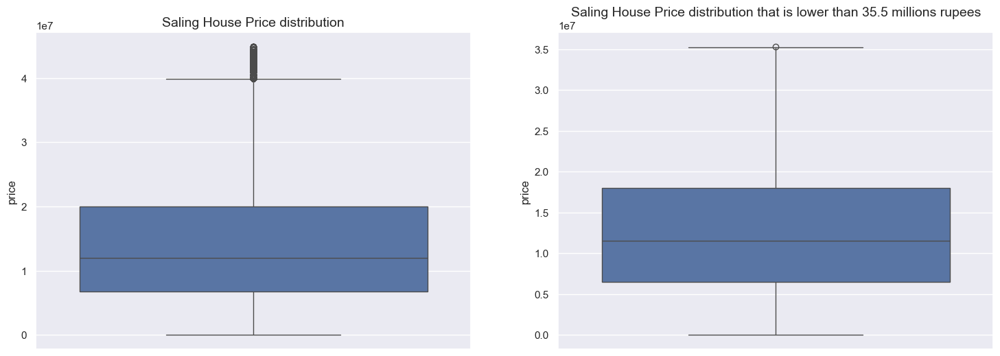

In [10]:
fig, axs = plt.subplots(1, 2, figsize=(18, 6))

_= sns.boxplot(y=houses_df.query('purpose == "For Sale"')['price'], ax=axs[0])
_= sns.boxplot(y=houses_df.query('price < 35500000 and purpose == "For Sale"')['price'], ax=axs[1])

axs[0].set_title('Saling House Price distribution', fontsize=14)
axs[1].set_title('Saling House Price distribution that is lower than 35.5 millions rupees', fontsize=14)

plt.savefig('Graphs/sales_price_distribution.png')
plt.show()

In [11]:
houses_df.query('price >= 35500000 and purpose == "For Sale"')

,property_type,price,location,city,baths,purpose,bedrooms,Area_in_Marla
3,House,43500000,Bani Gala,Islamabad,4,For Sale,4,40.0
6,Penthouse,40000000,F-11,Islamabad,5,For Sale,5,20.0
30,House,40000000,Multan Road,Lahore,5,For Sale,5,20.0
36,House,39500000,Gulberg,Lahore,6,For Sale,6,10.0
38,House,40000000,Chaman Park,Lahore,3,For Sale,6,11.0
...,...,...,...,...,...,...,...,...
99472,House,37000000,DHA Defence,Lahore,6,For Sale,5,20.0
99477,House,41500000,NFC 1,Lahore,6,For Sale,5,20.0
99484,House,39000000,DHA Defence,Lahore,6,For Sale,5,20.0
99487,House,44000000,DHA Defence,Lahore,7,For Sale,6,20.0


In [12]:
houses_df = houses_df[~((houses_df['price'] >= 35500000) & (houses_df['purpose'] == 'For Sale'))]

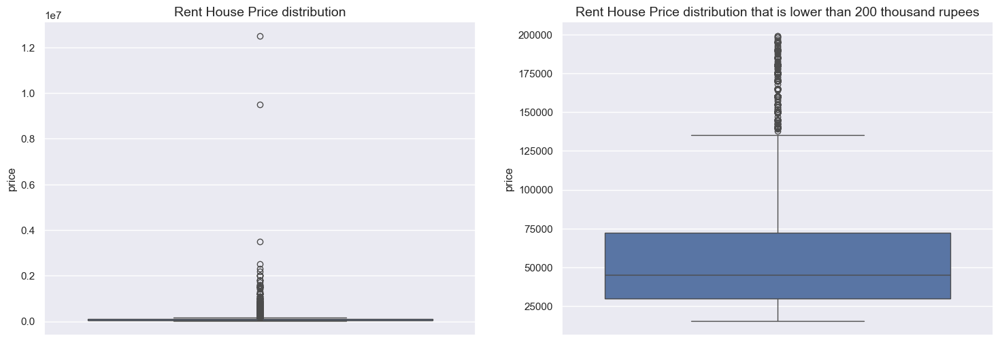

In [13]:
fig, axs = plt.subplots(1, 2, figsize=(18, 6))

_= sns.boxplot(y=houses_df.query('purpose == "For Rent"')['price'], ax=axs[0])
_= sns.boxplot(y=houses_df.query('price < 200000 and purpose == "For Rent"')['price'], ax=axs[1])

axs[0].set_title('Rent House Price distribution', fontsize=14)
axs[1].set_title('Rent House Price distribution that is lower than 200 thousand rupees', fontsize=14)

plt.savefig('Graphs/rent_price_distribution.png')
plt.show()

In [14]:
houses_df.query('price >= 200000 and purpose == "For Rent"')

,property_type,price,location,city,baths,purpose,bedrooms,Area_in_Marla
23,House,600000,F-7,Islamabad,6,For Rent,6,40.0
28,Lower Portion,200000,F-6,Islamabad,3,For Rent,3,16.0
149,House,220000,F-10,Islamabad,6,For Rent,6,20.0
152,House,240000,F-10,Islamabad,5,For Rent,5,20.0
153,House,280000,F-10,Islamabad,6,For Rent,6,20.0
...,...,...,...,...,...,...,...,...
99426,House,400000,F-6,Islamabad,4,For Rent,4,48.0
99428,House,230000,F-8,Islamabad,6,For Rent,5,20.0
99429,House,280000,F-7,Islamabad,4,For Rent,4,40.0
99430,House,500000,F-7,Islamabad,7,For Rent,6,22.0


In [15]:
houses_df = houses_df[~((houses_df['price'] >= 200000) & (houses_df['purpose'] == 'For Rent'))]

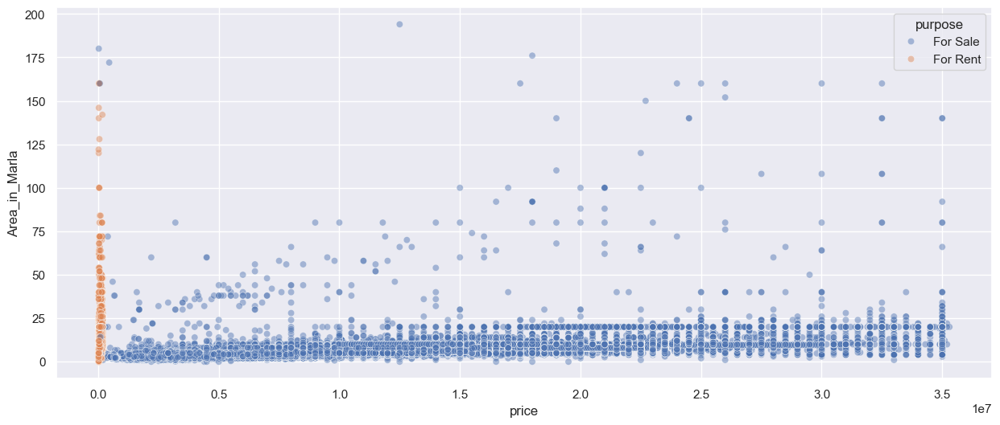

In [16]:
plt.figure(figsize=(15,6))
_= sns.scatterplot(data=houses_df,
                   x='price',
                   y='Area_in_Marla',
                   alpha=.45,
                   hue='purpose'
)

plt.savefig('Graphs/purpose_affection.png')

> As we see the price is been distributed among all the cities and there are no cities that seems to have higher pricies. But as for the rent pricies we see that almost all of the houses are in <code> Karachi </code> and <code>Islamabad</code>.

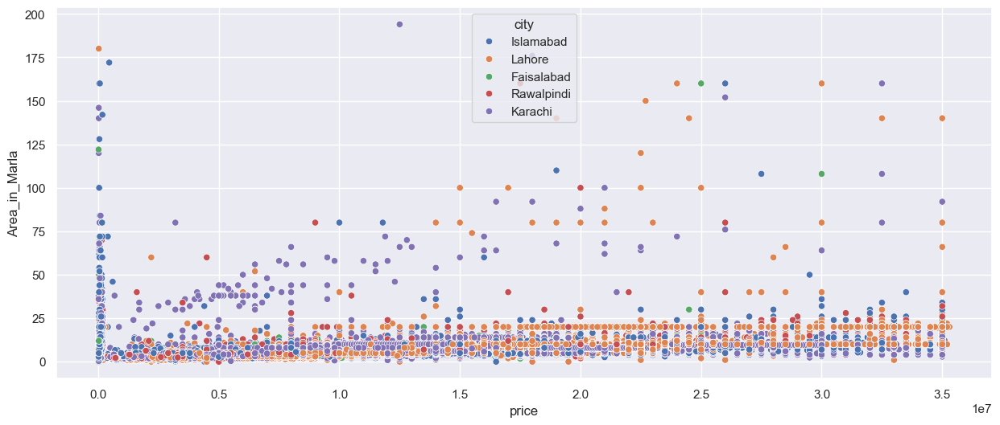

In [17]:
plt.figure(figsize=(15,6))
_= sns.scatterplot(data=houses_df,
                   x='price',
                   y='Area_in_Marla',
                   hue='city'
)

plt.savefig('Graphs/city_affection.png')

> Lets see some descriptive statistics of our variables

In [18]:
fig = plt.figure(figsize=(18, 12))

ax1 = plt.subplot2grid((2, 2), (0, 0), colspan=2)
ax2 = plt.subplot2grid((2, 2), (1, 0))
ax3 = plt.subplot2grid((2, 2), (1, 1))

sns.histplot(data=houses_df.query('purpose == "For Sale"'),
                x='price',
                hue='city',
                multiple="stack",
                ax=ax1)
ax1.set_title("Distribution of saling house prices along with city's proportion", fontsize=15)

sns.histplot(data=houses_df.query('purpose == "For Sale"'), x='city', ax=ax2)
ax2.set_title('Distribution of sale propertied among the cities', fontsize=15)

sns.histplot(data=houses_df.query('purpose == "For Sale"'), x='city', stat='percent', ax=ax3)
ax3.set_title('Percentage of sale propertied among the cities', fontsize=15)

plot = plt.gcf()
plt.close()

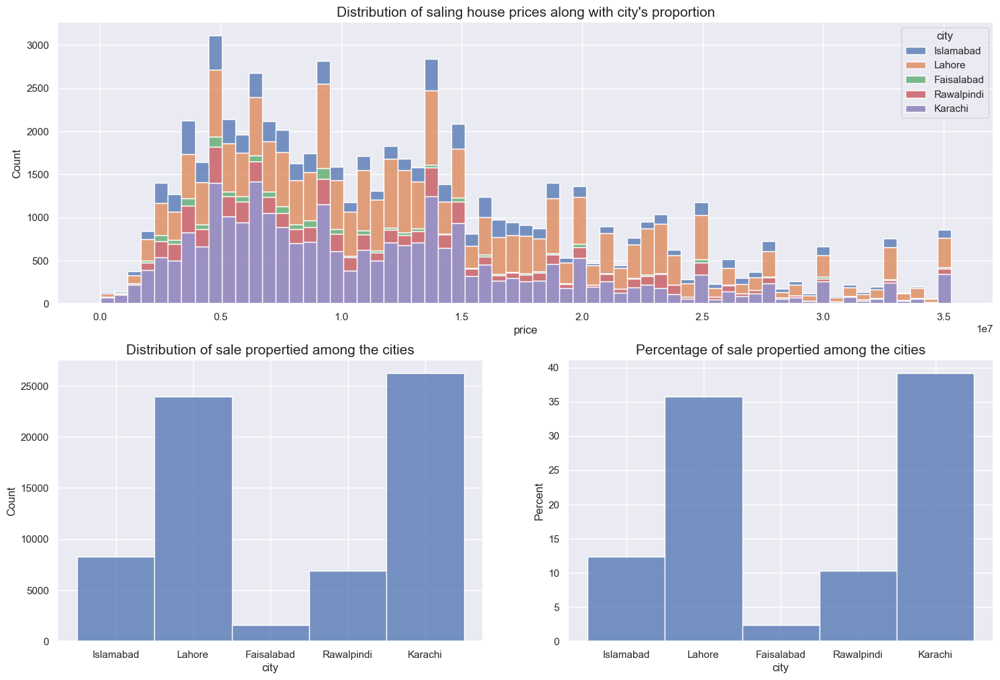

In [19]:
plot.savefig('Graphs/distribution_saling_prices_city.png')
plot

In [20]:
fig = plt.figure(figsize=(18, 12))

ax1 = plt.subplot2grid((2, 2), (0, 0), colspan=2)
ax2 = plt.subplot2grid((2, 2), (1, 0))
ax3 = plt.subplot2grid((2, 2), (1, 1))

_= sns.histplot(data=houses_df.query('purpose == "For Rent"'),
                x='price',
                hue='city',
                multiple="stack",
                ax=ax1)
ax1.set_xlim(0, 300000)
ax1.set_title("Distribution of rent house prices along with city's proportion", fontsize=15)


_= sns.histplot(data=houses_df.query('purpose == "For Rent"'), x='city', ax=ax2)
ax2.set_title('Distribution of rent propertied among the cities', fontsize=15)

_= sns.histplot(data=houses_df.query('purpose == "For Rent"'), x='city', stat='percent', ax=ax3)
ax3.set_title('Percentage of rent propertied among the cities', fontsize=15)

plot = plt.gcf()
plt.close()

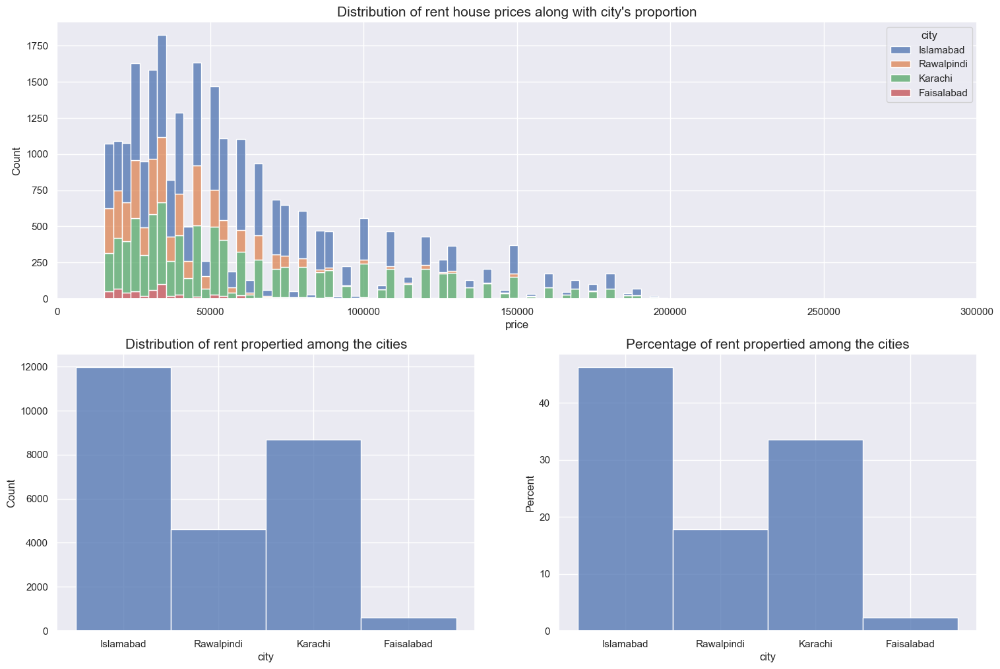

In [21]:
plot.savefig('Graphs/distribution_rent_prices_city.png')
plot

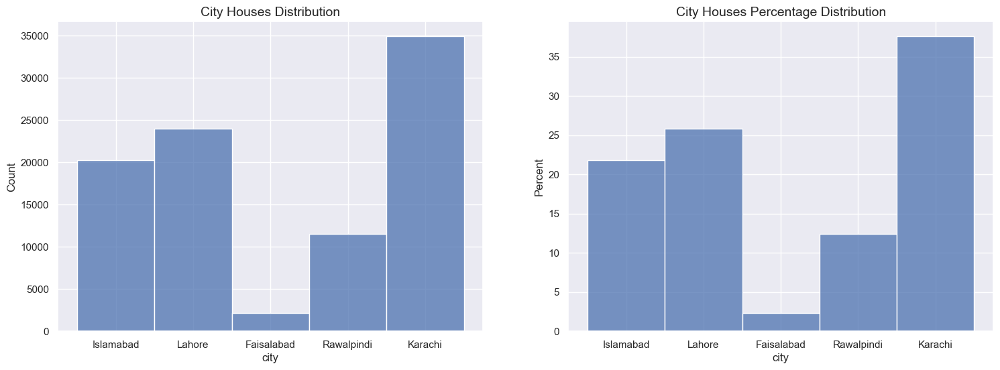

In [22]:
fig, axs = plt.subplots(1, 2, figsize=(18, 6))

_= sns.histplot(data=houses_df, x='city', ax=axs[0])
_= sns.histplot(data=houses_df, x='city', ax=axs[1], stat='percent')

axs[0].set_title('City Houses Distribution', fontsize=14)
axs[1].set_title('City Houses Percentage Distribution', fontsize=14)

plt.savefig('Graphs/cities_proportion.png')
plt.show()

In [23]:
fig, axs = plt.subplots(2, 1, figsize=(18,12))
_= sns.histplot(data=houses_df.query('purpose == "For Sale"'),
                x='price',
                hue='property_type',
                multiple="stack",
                ax=axs[0])
axs[0].set_title('Propertied type proportion in saling price distribution', fontsize=15)

_= sns.histplot(data=houses_df.query('purpose == "For Rent"'),
                x='price',
                hue='property_type',
                multiple="stack",
                stat='percent',
                ax=axs[1])
axs[1].set_title('Propertied type proportion in rent price distribution', fontsize=15)
axs[1].set_xlim(0, 300000)

plot = plt.gcf()
plt.close()

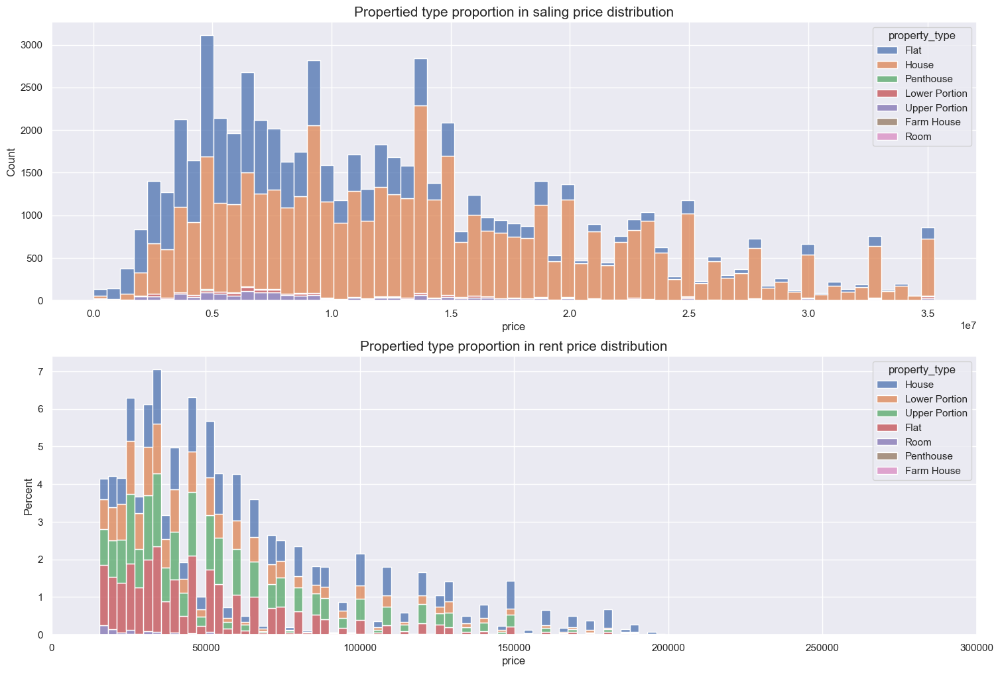

In [24]:
plot.savefig('Graphs/property_proportion_in_price.png')
plot

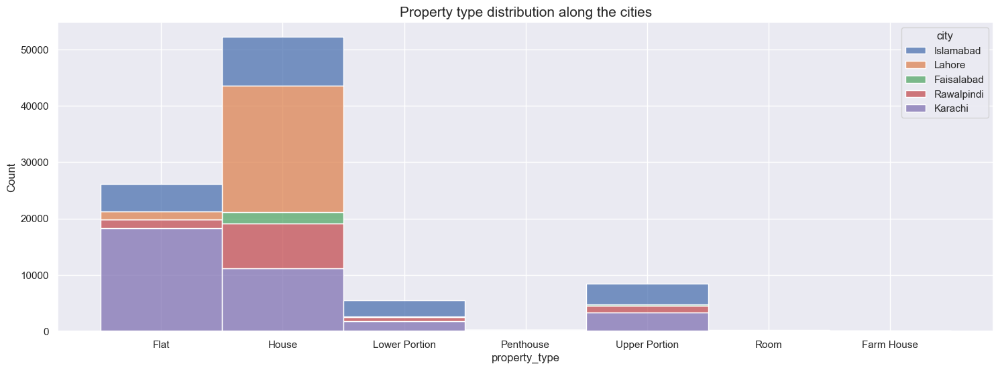

In [25]:
plt.figure(figsize=(18,6))
_= sns.histplot(data=houses_df,
                x='property_type',
                hue='city',
                multiple='stack'
               )
plt.title('Property type distribution along the cities', fontsize=15)

plt.savefig('Graphs/property_vs_city.png')
plt.show()

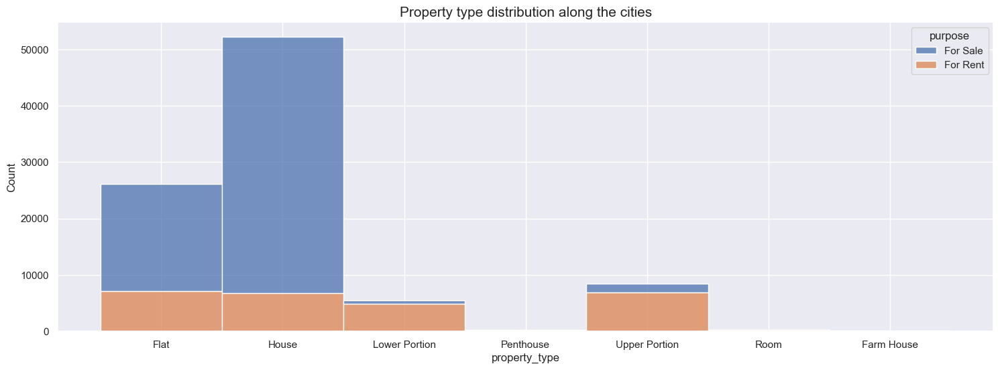

In [26]:
plt.figure(figsize=(18,6))
_= sns.histplot(data=houses_df,
                x='property_type',
                hue='purpose',
                multiple='stack'
               )
plt.title('Property type distribution along the cities', fontsize=15)

plt.savefig('Graphs/property_vs_purpose.png')
plt.show()

In [27]:
houses_df['property_type'].value_counts()

property_type
House            52255
Flat             26099
Upper Portion     8441
Lower Portion     5491
Room               241
Penthouse          227
Farm House          77
Name: count, dtype: int64

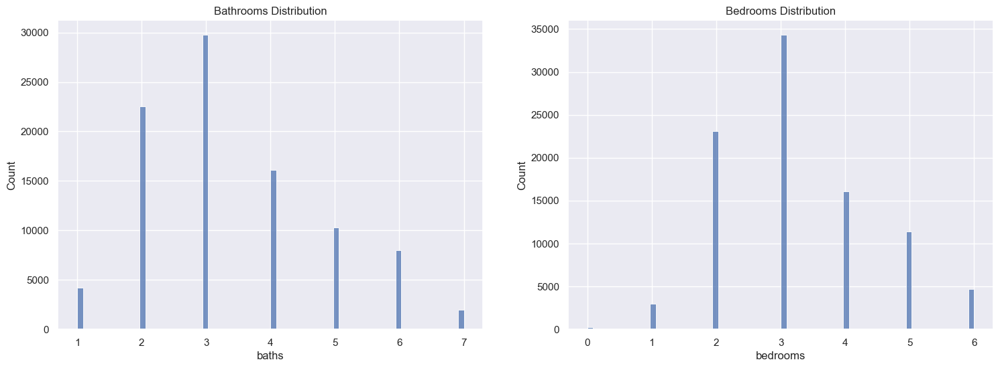

In [28]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

_= sns.histplot(x=houses_df['baths'], ax=axes[0])
axes[0].set_title('Bathrooms Distribution')

_= sns.histplot(x=houses_df['bedrooms'], ax=axes[1])
axes[1].set_title('Bedrooms Distribution')

plt.savefig('Graphs/bed_bath_distribution.png')
plt.show()

In [29]:
fig, axs = plt.subplots(nrows=2, figsize=(18, 12))

sns.histplot(houses_df.query('Area_in_Marla < 50')['Area_in_Marla'], ax=axs[0])
axs[0].set_title('Histogram of Area in Marla (Area < 50)', fontsize=14)
axs[0].set_xlabel('Area in Marla')

sns.histplot(houses_df['Area_in_Marla'], ax=axs[1])
axs[1].set_title('Histogram of Area in Marla (Full Data)', fontsize=14)
axs[1].set_xlabel('Area in Marla')

plt.tight_layout()
plot = plt.gcf()
plt.close()

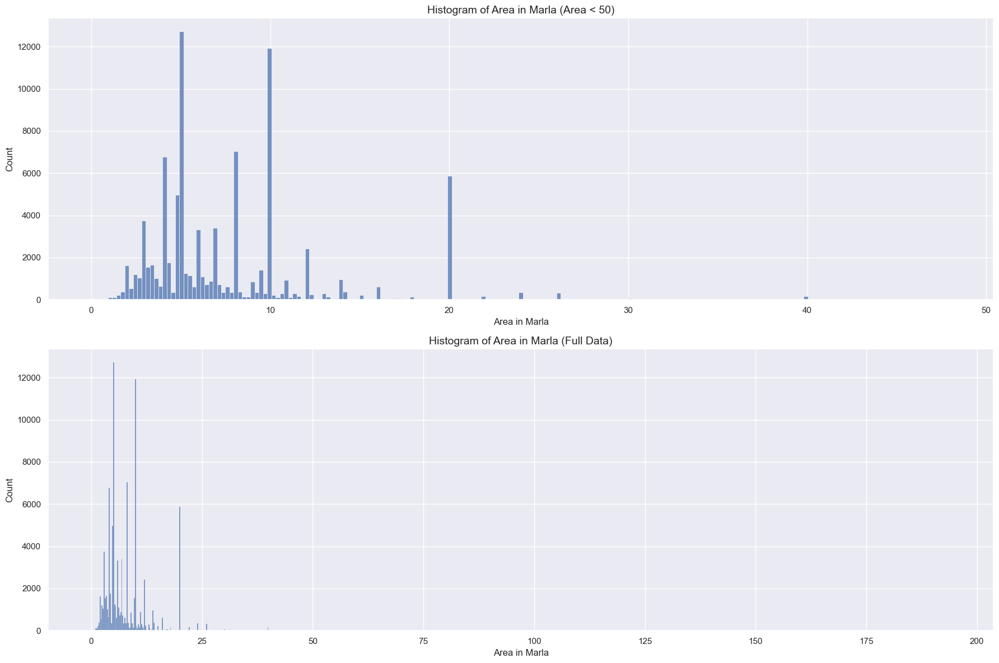

In [30]:
plot.savefig('Graphs/area_distribution.png')
plot

> Lets check about the correlation between the variables

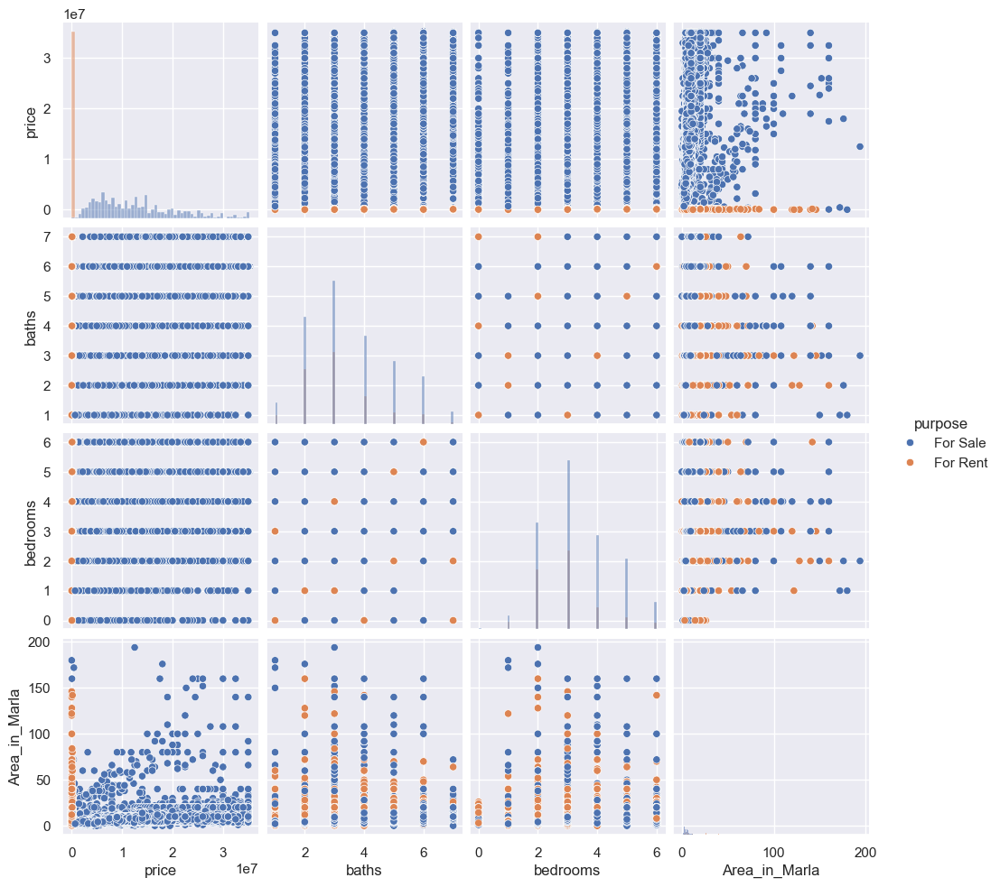

In [31]:
_= sns.pairplot(houses_df, hue='purpose', diag_kind="hist")
plt.savefig('Graphs/correlations.png')

In [32]:
houses_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 92831 entries, 0 to 99498
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   property_type  92831 non-null  object 
 1   price          92831 non-null  int64  
 2   location       92831 non-null  object 
 3   city           92831 non-null  object 
 4   baths          92831 non-null  int64  
 5   purpose        92831 non-null  object 
 6   bedrooms       92831 non-null  int64  
 7   Area_in_Marla  92831 non-null  float64
dtypes: float64(1), int64(3), object(4)
memory usage: 6.4+ MB


In [33]:
pd.get_dummies(houses_df, columns=['property_type', 'city'], drop_first=True, dtype=int).select_dtypes(include=[np.number]).corr()

,price,baths,bedrooms,Area_in_Marla,property_type_Flat,property_type_House,property_type_Lower Portion,property_type_Penthouse,property_type_Room,property_type_Upper Portion,city_Islamabad,city_Karachi,city_Lahore,city_Rawalpindi
price,1.000000,0.508654,0.480985,0.124838,-0.170192,0.414233,-0.222733,0.002537,-0.051283,-0.259620,-0.235246,-0.038145,0.340626,-0.085070
baths,0.508654,1.000000,0.851942,0.297490,-0.430886,0.522636,-0.114043,-0.016950,-0.079169,-0.117331,-0.021871,-0.269133,0.273038,0.051005
bedrooms,0.480985,0.851942,1.000000,0.276810,-0.431565,0.527357,-0.127497,-0.013577,-0.085567,-0.112337,-0.039802,-0.208267,0.218324,0.048188
Area_in_Marla,0.124838,0.297490,0.276810,1.000000,-0.205064,-0.027019,0.136458,0.010472,0.007636,0.219686,0.161350,-0.099541,-0.033561,0.001631
property_type_Flat,-0.170192,-0.430886,-0.431565,-0.205064,1.000000,-0.709699,-0.156806,-0.030963,-0.031906,-0.197786,-0.047272,0.421687,-0.295772,-0.124113
property_type_House,0.414233,0.522636,0.527357,-0.027019,-0.709699,1.000000,-0.284543,-0.056186,-0.057897,-0.358906,-0.144431,-0.379259,0.446856,0.098731
property_type_Lower Portion,-0.222733,-0.114043,-0.127497,0.136458,-0.156806,-0.284543,1.000000,-0.012414,-0.012792,-0.079300,0.180638,-0.026508,-0.144097,0.010019
property_type_Penthouse,0.002537,-0.016950,-0.013577,0.010472,-0.030963,-0.056186,-0.012414,1.000000,-0.002526,-0.015658,-0.012438,0.046231,-0.027201,-0.014009
property_type_Room,-0.051283,-0.079169,-0.085567,0.007636,-0.031906,-0.057897,-0.012792,-0.002526,1.000000,-0.016135,0.050929,-0.009876,-0.027665,-0.015355
property_type_Upper Portion,-0.259620,-0.117331,-0.112337,0.219686,-0.197786,-0.358906,-0.079300,-0.015658,-0.016135,1.000000,0.168076,0.011206,-0.181699,0.020923


> Cause the property_type had 7 different types and the model ends up using a least 6 more variables, in order to include the information provided by property_type, l created 3 categories that combined the types that the median price of the property was close enough to merge them in one category.

In [34]:
houses_df.drop(columns=['location', 'city', 'purpose']).groupby('property_type').median()

,price,baths,bedrooms,Area_in_Marla
property_type,,,,
Farm House,18000000.0,3.0,3.0,80.0
Flat,5400000.0,2.0,2.0,4.9
House,12000000.0,4.0,4.0,6.1
Lower Portion,45000.0,3.0,3.0,10.0
Penthouse,6500000.0,3.0,3.0,8.0
Room,25000.0,1.0,1.0,5.0
Upper Portion,55000.0,3.0,3.0,10.0


In [35]:
houses_df = houses_df.assign(
    expensive = np.where((houses_df['property_type'] == 'Farm House') | \
                    (houses_df['property_type'] == 'House'), \
                    1, 0),
    affordable = np.where((houses_df['property_type'] == 'Flat') | \
                   (houses_df['property_type'] == 'Penthouse'), \
                   1, 0),
    low = np.where((houses_df['property_type'] == 'Lower Portion') | \
                   (houses_df['property_type'] == 'Room'), \
                   1, 0),
)
houses_df.head()

,property_type,price,location,city,baths,purpose,bedrooms,Area_in_Marla,expensive,affordable,low
0,Flat,10000000,G-10,Islamabad,2,For Sale,2,4.0,0,1,0
1,Flat,6900000,E-11,Islamabad,3,For Sale,3,5.6,0,1,0
2,House,16500000,G-15,Islamabad,6,For Sale,5,8.0,1,0,0
4,House,7000000,DHA Defence,Islamabad,3,For Sale,3,8.0,1,0,0
5,Flat,7800000,E-11,Islamabad,2,For Sale,2,6.2,0,1,0


> Now lets try to include the area in marla too <br>
> The difference with this column is that there are plenty of different areas (240) so we can't do it brute force by creating dummy variables or categorize them. So lets try clustering

In [36]:
houses_df['Area_in_Marla'].nunique()

235

In [37]:
sorted(houses_df['Area_in_Marla'].unique())

[0.0,
 0.2,
 0.4,
 0.5,
 0.6,
 0.7,
 0.8,
 0.9,
 1.0,
 1.1,
 1.2,
 1.3,
 1.4,
 1.5,
 1.6,
 1.7,
 1.8,
 1.9,
 2.0,
 2.1,
 2.2,
 2.3,
 2.4,
 2.5,
 2.6,
 2.7,
 2.8,
 2.9,
 3.0,
 3.1,
 3.2,
 3.3,
 3.4,
 3.5,
 3.6,
 3.7,
 3.8,
 3.9,
 4.0,
 4.1,
 4.2,
 4.3,
 4.4,
 4.5,
 4.6,
 4.7,
 4.8,
 4.9,
 5.0,
 5.1,
 5.2,
 5.3,
 5.4,
 5.5,
 5.6,
 5.7,
 5.8,
 5.9,
 6.0,
 6.1,
 6.2,
 6.3,
 6.4,
 6.5,
 6.6,
 6.7,
 6.8,
 6.9,
 7.0,
 7.1,
 7.2,
 7.3,
 7.4,
 7.5,
 7.6,
 7.7,
 7.8,
 7.9,
 8.0,
 8.1,
 8.2,
 8.3,
 8.4,
 8.5,
 8.6,
 8.7,
 8.8,
 8.9,
 9.0,
 9.1,
 9.2,
 9.3,
 9.4,
 9.5,
 9.6,
 9.7,
 9.8,
 9.9,
 10.0,
 10.1,
 10.2,
 10.3,
 10.4,
 10.5,
 10.6,
 10.7,
 10.8,
 10.9,
 11.0,
 11.1,
 11.2,
 11.3,
 11.4,
 11.5,
 11.6,
 11.7,
 11.8,
 11.9,
 12.0,
 12.1,
 12.2,
 12.3,
 12.4,
 12.5,
 12.6,
 12.7,
 12.8,
 12.9,
 13.0,
 13.1,
 13.2,
 13.3,
 13.4,
 13.5,
 13.6,
 13.7,
 13.8,
 13.9,
 14.0,
 14.2,
 14.3,
 14.4,
 14.5,
 14.6,
 14.7,
 14.8,
 14.9,
 15.0,
 15.1,
 15.2,
 15.3,
 15.4,
 15.5,
 15.6,
 15.7,
 15.9,
 16.0,

> So let's check if according to the city, the area in marla and the purpose changes the pricing significantly.
> Also l tried to performe a Kmeans if it might tell us something.

In [38]:
columns = houses_df['city'].unique()
df = []

fig, axs = plt.subplots(len(columns), sharex=True, figsize=(17, 18))

for i in range(len(columns)):
    # Separating the cities
    city = houses_df[houses_df['city'] == columns[i]]
    df.append(city)
    
    # Clustering for every city
    kmeans = KMeans(n_clusters=2)
    kmeans.fit(df[i].loc[:, ['Area_in_Marla', 'price']])
    df[i] = df[i].assign(cluster=kmeans.labels_)
    
    # Ploting
    _= sns.scatterplot(x=df[i]['Area_in_Marla'],
                       y=df[i]['price'],
                       hue=df[i]['cluster'],
                       ax=axs[i]
        )
    axs[i].set_title(columns[i])

plot = plt.gcf()
plt.close()

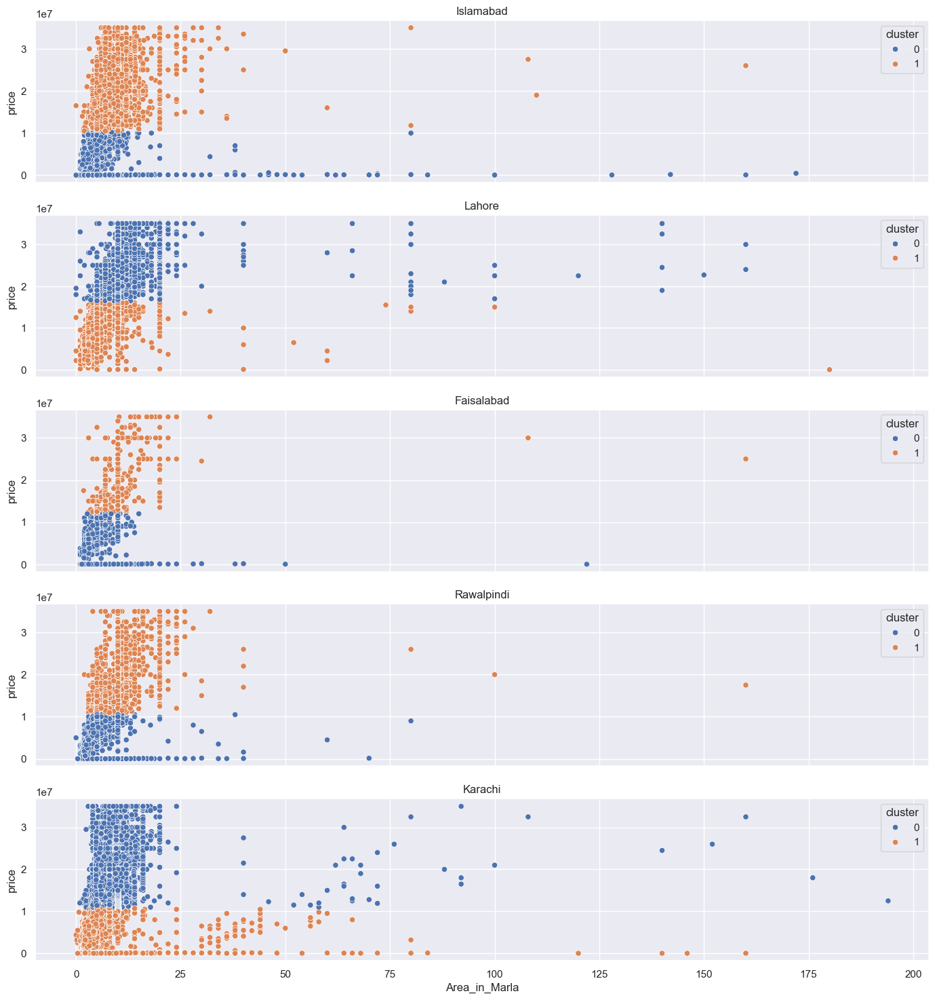

In [39]:
plot.savefig('Graphs/area_price_kmeans_clustering.png')
plot

> Actually this above diagram does tell us anything about the areas but it told us something more importante. That the price is a bit curved when it goes up so we might need to do a log in the modeling. <br>
> This is more cleary and in the below diagram that shows the total prices according to the marla's areas

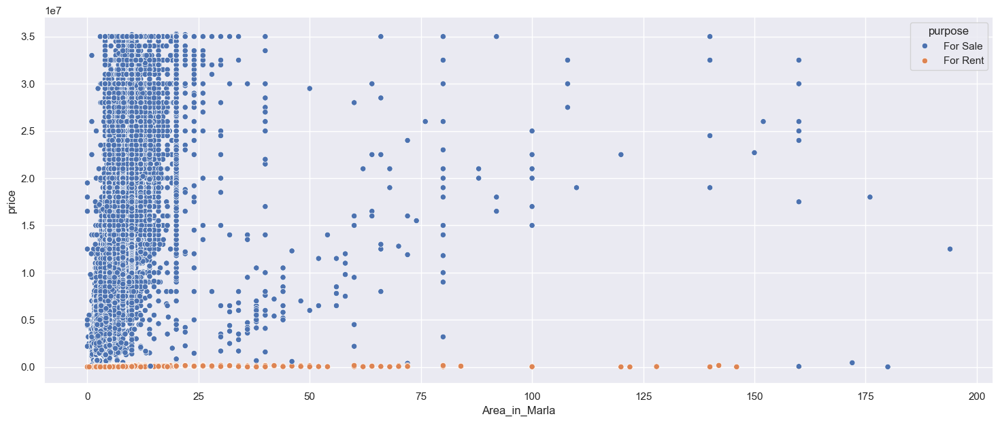

In [40]:
plt.figure(figsize=(18, 7))
_= sns.scatterplot(x=houses_df['Area_in_Marla'], y=houses_df['price'], hue=houses_df['purpose'])

plt.savefig('Graphs/price_scaling.png')

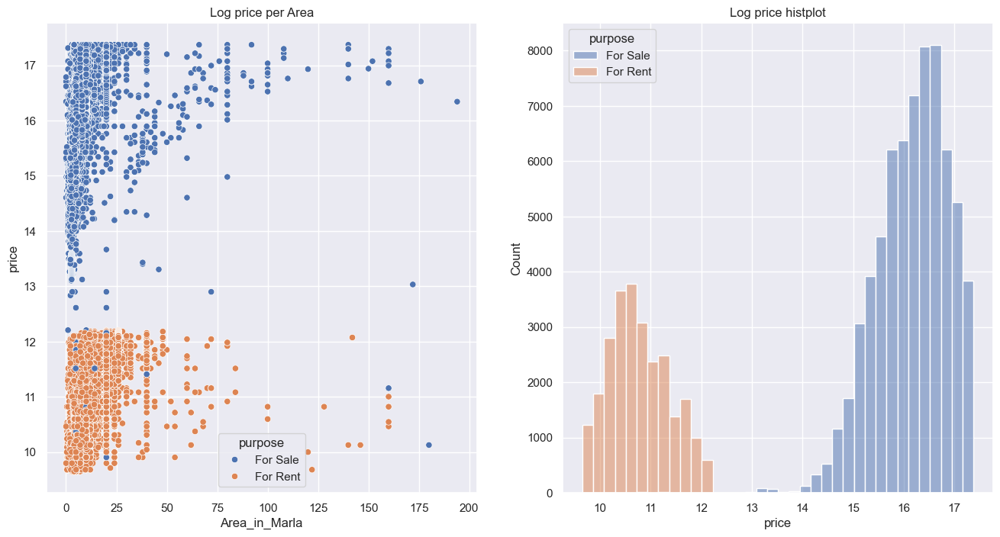

In [41]:
fig, axs = plt.subplots(1, 2, figsize=(16,8))
_= sns.scatterplot(y=np.log(houses_df['price']), x=houses_df['Area_in_Marla'], hue=houses_df['purpose'], ax=axs[0])
_= sns.histplot(x=np.log(houses_df['price']), hue=houses_df['purpose'], ax=axs[1])

axs[0].set_title('Log price per Area')
axs[1].set_title('Log price histplot')

plt.savefig('Graphs/log_price_scaling.png')

> So lets create dummy variables for our categorical features and include them in our model.

In [42]:
houses_df[['property_type', 'purpose', 'city']].describe()

,property_type,purpose,city
count,92831,92831,92831
unique,7,2,5
top,House,For Sale,Karachi
freq,52255,66966,34897


> With the help of get_dummies we categories this 3 variables and creating dummy variables for each one

In [43]:
houses_df = houses_df.join(pd.get_dummies(houses_df['property_type'], drop_first=True, dtype=int))
houses_df = houses_df.join(pd.get_dummies(houses_df['purpose'], drop_first=True, dtype=int))
houses_df = houses_df.join(pd.get_dummies(houses_df['city'], drop_first=True, dtype=int))
houses_df.head()

,property_type,price,location,city,baths,purpose,bedrooms,Area_in_Marla,expensive,affordable,low,Flat,House,Lower Portion,Penthouse,Room,Upper Portion,For Sale,Islamabad,Karachi,Lahore,Rawalpindi
0,Flat,10000000,G-10,Islamabad,2,For Sale,2,4.0,0,1,0,1,0,0,0,0,0,1,1,0,0,0
1,Flat,6900000,E-11,Islamabad,3,For Sale,3,5.6,0,1,0,1,0,0,0,0,0,1,1,0,0,0
2,House,16500000,G-15,Islamabad,6,For Sale,5,8.0,1,0,0,0,1,0,0,0,0,1,1,0,0,0
4,House,7000000,DHA Defence,Islamabad,3,For Sale,3,8.0,1,0,0,0,1,0,0,0,0,1,1,0,0,0
5,Flat,7800000,E-11,Islamabad,2,For Sale,2,6.2,0,1,0,1,0,0,0,0,0,1,1,0,0,0


In [44]:
houses_df.drop(columns=['city', 'location', 'purpose', 'property_type']).corr()

,price,baths,bedrooms,Area_in_Marla,expensive,affordable,low,Flat,House,Lower Portion,Penthouse,Room,Upper Portion,For Sale,Islamabad,Karachi,Lahore,Rawalpindi
price,1.000000,0.508654,0.480985,0.124838,0.415756,-0.169468,-0.229144,-0.170192,0.414233,-0.222733,0.002537,-0.051283,-0.259620,0.647767,-0.235246,-0.038145,0.340626,-0.085070
baths,0.508654,1.000000,0.851942,0.297490,0.522686,-0.431613,-0.128511,-0.430886,0.522636,-0.114043,-0.016950,-0.079169,-0.117331,0.150167,-0.021871,-0.269133,0.273038,0.051005
bedrooms,0.480985,0.851942,1.000000,0.276810,0.527126,-0.431920,-0.143051,-0.431565,0.527357,-0.127497,-0.013577,-0.085567,-0.112337,0.160171,-0.039802,-0.208267,0.218324,0.048188
Area_in_Marla,0.124838,0.297490,0.276810,1.000000,-0.008207,-0.203378,0.135357,-0.205064,-0.027019,0.136458,0.010472,0.007636,0.219686,-0.256966,0.161350,-0.099541,-0.033561,0.001631
expensive,0.415756,0.522686,0.527126,-0.008207,1.000000,-0.715199,-0.291614,-0.710897,0.998315,-0.285023,-0.056281,-0.057995,-0.359512,0.380486,-0.144504,-0.379742,0.447553,0.098584
affordable,-0.169468,-0.431613,-0.431920,-0.203378,-0.715199,1.000000,-0.161403,0.993984,-0.713994,-0.157755,0.078692,-0.032099,-0.198983,0.007147,-0.048511,0.425647,-0.297976,-0.125322
low,-0.229144,-0.128511,-0.143051,0.135357,-0.291614,-0.161403,1.000000,-0.160432,-0.291123,0.977401,-0.012701,0.198875,-0.081133,-0.346693,0.187812,-0.028069,-0.147079,0.006574
Flat,-0.170192,-0.430886,-0.431565,-0.205064,-0.710897,0.993984,-0.160432,1.000000,-0.709699,-0.156806,-0.030963,-0.031906,-0.197786,0.006778,-0.047272,0.421687,-0.295772,-0.124113
House,0.414233,0.522636,0.527357,-0.027019,0.998315,-0.713994,-0.291123,-0.709699,1.000000,-0.284543,-0.056186,-0.057897,-0.358906,0.379753,-0.144431,-0.379259,0.446856,0.098731
Lower Portion,-0.222733,-0.114043,-0.127497,0.136458,-0.285023,-0.157755,0.977401,-0.156806,-0.284543,1.000000,-0.012414,-0.012792,-0.079300,-0.337245,0.180638,-0.026508,-0.144097,0.010019


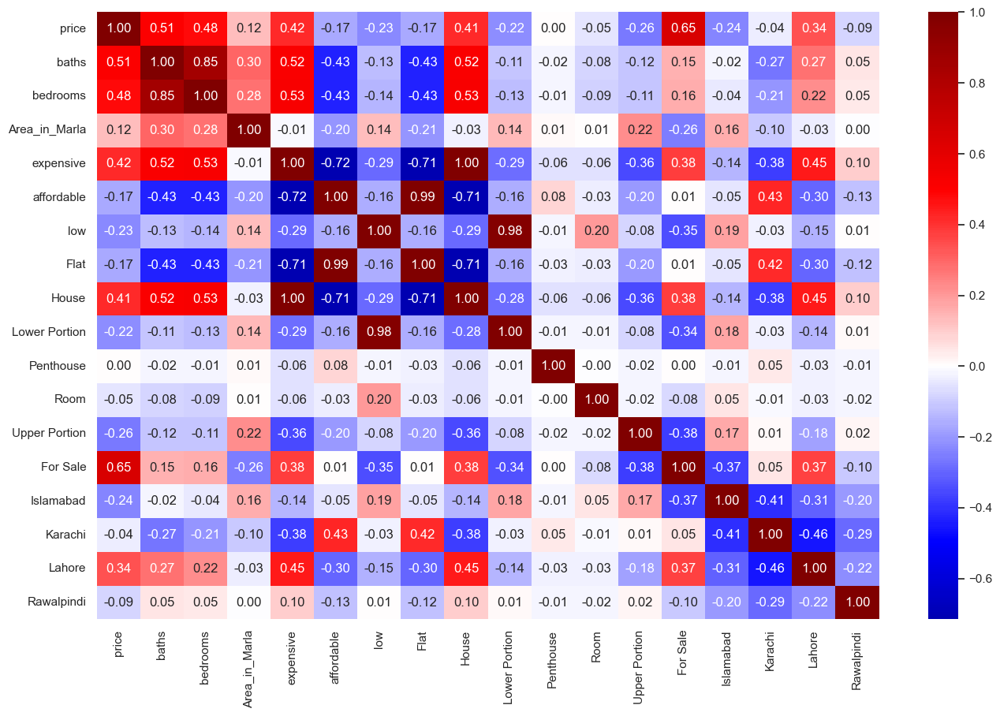

In [45]:
plt.figure(figsize=(16, 10))
sns.heatmap(houses_df.drop(columns=['city', 'location', 'purpose', 'property_type']).corr(), cmap='seismic', annot=True, fmt=".2f", cbar=True, center=0)

plt.savefig('Graphs/heatmap.png')
plt.show()

## 4. Modeling
---

### Linear Regression

> Here I initialize some methods that prints plots and metrics that has to do with model predictions and the residuals, in order to track our modeling performance and improve it

In [46]:
def resid_predict_plots(model, y, X, string):
    fig, axs = plt.subplots(1, 2, sharey=True, figsize=(18, 6))

    sns.scatterplot(y=y - model.predict(X),
                    x=model.predict(X),
                    alpha=.45,
                    ax=axs[0]
    )
    axs[0].set_title('Residuals plot')
    axs[0].set_xlabel('Predictions')
    axs[0].set_ylabel('Residuals')

    _= stats.probplot(y - model.predict(X), dist='norm', plot=axs[1])
    _= axs[1].set_title('Q-Q normality plot')
    
    plt.savefig(f'Graphs/{string}.png')

def resid_metrics(model, x, y):
    print(f"MAE: {round(mae(y, model.predict(x)), 2)}")
    print(f"MSE: {round(mse(y, model.predict(x), squared=True), 2)}")
    print(f"RMSE: {round(mse(y, model.predict(x), squared=False), 2)}")
    print(f"R2: {round(r2(y, model.predict(x)), 4)}")
    
def multicollinearity_metric(model, x, y):
    varibles = sm.OLS(y, x).exog
    vif_metrics = pd.DataFrame([vif(varibles, i) for i in range(varibles.shape[1])], columns=['VIF'])
    vif_metrics = vif_metrics.set_index(x.columns)
    print(vif_metrics)

def outliers_influence_summary(model):
    influence = model.get_influence()
    infl_summary = influence.summary_frame()
    print(infl_summary.sort_values(by='cooks_d', ascending=False))

> So lets move on the modeling and create the regression model starting with declearing the independent variables. <br>
> Lines that are commented are ways that l tried to evaluate in order to increase the model performance and didn't improved anything.

In [47]:
houses_df.columns

Index(['property_type', 'price', 'location', 'city', 'baths', 'purpose',
       'bedrooms', 'Area_in_Marla', 'expensive', 'affordable', 'low', 'Flat',
       'House', 'Lower Portion', 'Penthouse', 'Room', 'Upper Portion',
       'For Sale', 'Islamabad', 'Karachi', 'Lahore', 'Rawalpindi'],
      dtype='object')

In [48]:
# houses_df['bed_bath_multi'] = houses_df['bedrooms'] * houses_df['baths']
# houses_df['bed_bath_ratio'] = houses_df['bedrooms'] / houses_df['baths']
houses_df['bed_sq'] = houses_df['bedrooms'] ** 2
# houses_df['price_log2'] = np.log2(houses_df['price'])
# houses_df['price_log'] = np.log(houses_df['price'])
houses_df['bath_sq'] = houses_df['baths'] ** 2
houses_df['price_log10'] = np.log10(houses_df['price'])

features = [
    'baths',
    'bath_sq',
    'bedrooms',
    'bed_sq',
#     'bed_bath_multi',
#     'bed_bath_ratio',
    'For Sale',
#     'expensive',
    'affordable',
#     'low',
#     'Flat',
#     'House',
#     'Lower Portion',
    'Penthouse',
#     'Upper Portion',
    'Room',
    'Islamabad',
    'Karachi',
    'Lahore',
    'Rawalpindi',
]

> lets now split the data into training, validation, testing and fit the model

In [49]:
X = sm.add_constant(houses_df[features])
y = houses_df['price_log10']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=33)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.25, random_state=33)

ols = sm.OLS(y_train, X_train).fit()

In [50]:
ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            price_log10   R-squared:                       0.958
Model:                            OLS   Adj. R-squared:                  0.958
Method:                 Least Squares   F-statistic:                 1.059e+05
Date:                Mon, 29 Jan 2024   Prob (F-statistic):               0.00
Time:                        21:28:55   Log-Likelihood:                 4613.4
No. Observations:               55698   AIC:                            -9201.
Df Residuals:                   55685   BIC:                            -9085.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.7410      0.010    388.812      0.000       3.722       3.760
baths          0.2499      0.005     55.368      0.000       0.241       0.259
bath_sq       -0.0189      0.001    -34.389      0.000      -0.020      -0.018
bedrooms       0.1086      0.005     20.511      0.000       0.098       0.119
bed_sq        -0.0088      0.001    -12.557      0.000      -0.010      -0.007
For Sale       2.2680      0.002    936.080      0.000       2.263       2.273
affordable     0.0112      0.003      4.294      0.000       0.006       0.016
Penthouse      0.0393      0.019      2.047      0.041       0.002       0.077
Room           0.1182      0.019      6.288      0.000       0.081       0.155
Islamabad      0.1532      0.007     23.509      0.000       0.140       0.166
Karachi        0.1857      0.006     28.871      0.000       0.173       0.198
Lahore         0.1340      0.006     20.793      0.000       0.121       0.147
Rawalpindi     0.0572      0.007      8.541      0.000       0.044       0.070
==============================================================================
Omnibus:                    12729.753   Durbin-Watson:                   2.004
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           131466.748
Skew:                          -0.806   Prob(JB):                         0.00
Kurtosis:                      10.352   Cond. No.                         470.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

> Lets see some metrics about the fitted model

In [51]:
print("**Training Data Metrics**")
resid_metrics(ols, X_train, y_train)

**Training Data Metrics**
MAE: 0.17
MSE: 0.05
RMSE: 0.22
R2: 0.958


> Lets score now in the validation data and see some metrics that we have

In [52]:
print("**Validation Data Metrics**")
resid_metrics(ols, X_valid, y_valid)

**Validation Data Metrics**
MAE: 0.17
MSE: 0.05
RMSE: 0.22
R2: 0.9594


In [53]:
print(f'Training data score: {round(r2(y_train, ols.predict(X_train)), 4)}')
print(f'Validation data score: {round(r2(y_valid, ols.predict(X_valid)), 4)}')

Training data score: 0.958
Validation data score: 0.9594


> QQ plot seams really good! normality is exactly on the line between (-2.5, +2.5) so that's good <br>
> Also the residuals plot seams to have like 2 groups which is rent and sales prices. This was expected cause in the histplot we could see the same gap in the middle

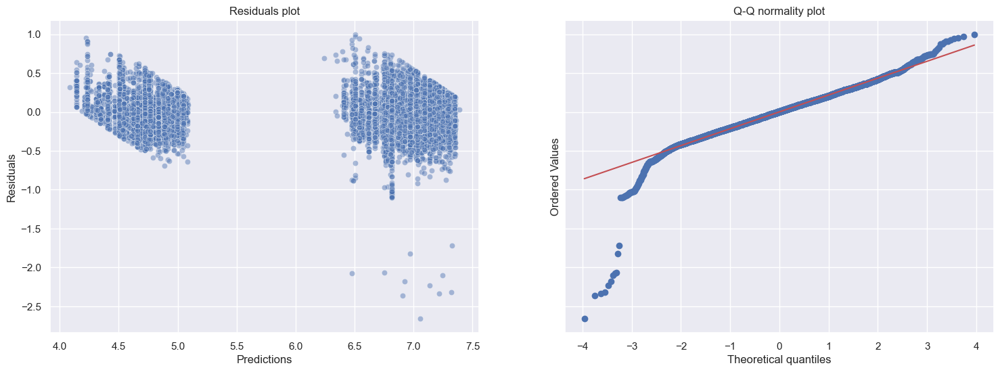

In [54]:
resid_predict_plots(ols, y_valid, X_valid, 'Validation Residual Analysis')

> The only feature variable that we could paint it as a red mark is the cities when we got dummied for the city but cause its a dummy variable we dont mind and we must expect such small murticollinearity problems.

In [55]:
multicollinearity_metric(ols, X_valid, y_valid)

                   VIF
const       103.987591
baths        44.381770
bath_sq      39.856320
bedrooms     46.052278
bed_sq       41.529839
For Sale      1.323743
affordable    1.552435
Penthouse     1.007560
Room          1.046209
Islamabad     8.249267
Karachi      11.072701
Lahore        9.003618
Rawalpindi    5.479244


> Outliers influence check

In [56]:
# outliers_influence_summary(ols)

> Now lets check the testing data and then we will train again with both the train and validation data and score in the test to see the differencies.

In [57]:
resid_metrics(ols, X_test, y_test)

MAE: 0.17
MSE: 0.05
RMSE: 0.22
R2: 0.9583


In [58]:
print(f'Training data score: {round(r2(y_train, ols.predict(X_train)), 4)}')
print(f'Validation data score: {round(r2(y_valid, ols.predict(X_valid)), 4)}')
print(f'Test data score: {round(r2(y_test, ols.predict(X_test)), 4)}')

Training data score: 0.958
Validation data score: 0.9594
Test data score: 0.9583


> Lets now check if the train score is similar to the testing score is we train the model with both the train and valid datasets <br>

In [59]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=33)
ols = sm.OLS(y_train, X_train).fit()

In [60]:
ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            price_log10   R-squared:                       0.958
Model:                            OLS   Adj. R-squared:                  0.958
Method:                 Least Squares   F-statistic:                 1.425e+05
Date:                Mon, 29 Jan 2024   Prob (F-statistic):               0.00
Time:                        21:28:55   Log-Likelihood:                 6326.6
No. Observations:               74264   AIC:                        -1.263e+04
Df Residuals:                   74251   BIC:                        -1.251e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.7395      0.008    449.873      0.000       3.723       3.756
baths          0.2494      0.004     64.126      0.000       0.242       0.257
bath_sq       -0.0188      0.000    -39.802      0.000      -0.020      -0.018
bedrooms       0.1086      0.005     23.733      0.000       0.100       0.118
bed_sq        -0.0088      0.001    -14.637      0.000      -0.010      -0.008
For Sale       2.2701      0.002   1086.256      0.000       2.266       2.274
affordable     0.0123      0.002      5.479      0.000       0.008       0.017
Penthouse      0.0276      0.016      1.680      0.093      -0.005       0.060
Room           0.1239      0.016      7.665      0.000       0.092       0.156
Islamabad      0.1564      0.006     27.739      0.000       0.145       0.167
Karachi        0.1859      0.006     33.398      0.000       0.175       0.197
Lahore         0.1354      0.006     24.284      0.000       0.124       0.146
Rawalpindi     0.0600      0.006     10.355      0.000       0.049       0.071
==============================================================================
Omnibus:                    16508.570   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           167054.612
Skew:                          -0.782   Prob(JB):                         0.00
Kurtosis:                      10.179   Cond. No.                         465.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [61]:
resid_metrics(ols, X_test, y_test)

MAE: 0.17
MSE: 0.05
RMSE: 0.22
R2: 0.9583


In [62]:
print(f'Training data score: {round(r2(y_train, ols.predict(X_train)), 4)}')
print(f'Test data score: {round(r2(y_test, ols.predict(X_test)), 4)}')

Training data score: 0.9584
Test data score: 0.9583


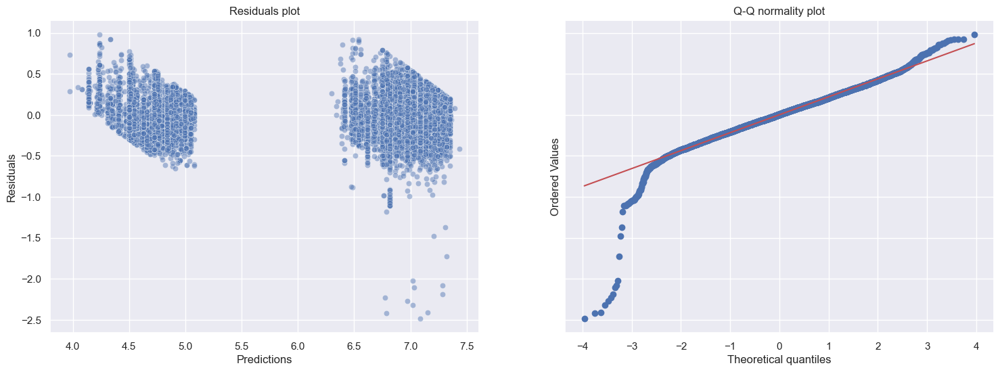

In [63]:
resid_predict_plots(ols, y_test, X_test, 'Testing Residual Analysis')

In [64]:
multicollinearity_metric(ols, X_test, y_test)

                   VIF
const       102.175533
baths        42.923166
bath_sq      38.916771
bedrooms     42.907160
bed_sq       39.004201
For Sale      1.324223
affordable    1.544464
Penthouse     1.007254
Room          1.025907
Islamabad     8.378069
Karachi      11.182906
Lahore        9.264090
Rawalpindi    5.665718


> So! The model has gone well with the simple traing, validation and test split. Lets see if there is any improvment we can do if we use cross validation <br>
> And as we see the score is exactly the same as the simple train and test split. So thats good!

In [65]:
kf = KFold(n_splits=5, shuffle=True, random_state=33)

cross_valid = []

for train_id, valid_id in kf.split(X, y):
    X_train, y_train = X.iloc[train_id], y.iloc[train_id]
    X_valid, y_valid = X.iloc[valid_id], y.iloc[valid_id]
    
    ols = sm.OLS(y_train, X_train).fit()
    cross_valid.append(r2(y_valid, ols.predict(X_valid)))

print("Cross Validation Scores: ", [round(x, 4) for x in cross_valid])
print(f"Cross Validation Average Score: {round(np.mean(cross_valid), 4)} +- {round(np.std(cross_valid), 4)}" )

Cross Validation Scores:  [0.9583, 0.9575, 0.9594, 0.9585, 0.958]
Cross Validation Average Score: 0.9583 +- 0.0006


### Ridge Regression

> Lets also try if a regularized regression can have better results. <br>
> The problem here that we will need to solve is that we must find the best value for the hyperparameter alpha in order to optimize the algorithm.

> Lets try first with a random value to see.

In [66]:
ridge = Ridge(alpha=10)
ridge.fit(X_train, y_train)

Ridge(alpha=10)

> With a full penalty we see that we are very close to the same score we had with a linear regression.

In [67]:
ridge.score(X_test, y_test)

0.9582981536147565

In [68]:
resid_metrics(ridge, X_test, y_test)

MAE: 0.17
MSE: 0.05
RMSE: 0.22
R2: 0.9583


> The coefficients of Ridge regression model

In [69]:
print('*** Ridge Coefficients ***')
list(zip(X_train.columns, ridge.coef_))

*** Ridge Coefficients ***


[('const', 0.0),
 ('baths', 0.24648925060980634),
 ('bath_sq', -0.0184057615901337),
 ('bedrooms', 0.10532354590385037),
 ('bed_sq', -0.008492742701278366),
 ('For Sale', 2.2703680327465343),
 ('affordable', 0.01156061820760625),
 ('Penthouse', 0.021161037075092533),
 ('Room', 0.10820016258335101),
 ('Islamabad', 0.1505724723261861),
 ('Karachi', 0.17951858358893039),
 ('Lahore', 0.1284396854695441),
 ('Rawalpindi', 0.05431218116259118)]

### RidgeCV Regression

> Lets see with a cross validation if this score is correct. <br>
> We can see that the score is the same but the alpha is different than this we used.

In [70]:
alphas = np.concatenate([np.linspace(0.00001, 1, 50), np.linspace(1, 100, 25), np.linspace(100, 1000, 25)])

ridgecv = RidgeCV(alphas=alphas, cv=10)
ridgecv.fit(X_train, y_train)

RidgeCV(alphas=array([1.00000000e-05, 2.04179592e-02, 4.08259184e-02, 6.12338776e-02,
       8.16418367e-02, 1.02049796e-01, 1.22457755e-01, 1.42865714e-01,
       1.63273673e-01, 1.83681633e-01, 2.04089592e-01, 2.24497551e-01,
       2.44905510e-01, 2.65313469e-01, 2.85721429e-01, 3.06129388e-01,
       3.26537347e-01, 3.46945306e-01, 3.67353265e-01, 3.87761224e-01,
       4.08169184e-01, 4.28577143e-0...
       1.37500000e+02, 1.75000000e+02, 2.12500000e+02, 2.50000000e+02,
       2.87500000e+02, 3.25000000e+02, 3.62500000e+02, 4.00000000e+02,
       4.37500000e+02, 4.75000000e+02, 5.12500000e+02, 5.50000000e+02,
       5.87500000e+02, 6.25000000e+02, 6.62500000e+02, 7.00000000e+02,
       7.37500000e+02, 7.75000000e+02, 8.12500000e+02, 8.50000000e+02,
       8.87500000e+02, 9.25000000e+02, 9.62500000e+02, 1.00000000e+03]),
        cv=10)

In [71]:
ridgecv.score(X_test, y_test)

0.9582985004585495

In [72]:
resid_metrics(ridgecv, X_test, y_test)

MAE: 0.17
MSE: 0.05
RMSE: 0.22
R2: 0.9583


In [73]:
ridgecv.alpha_

5.125

> The coefficient of the Ridge CV model

In [74]:
print('*** RidgeCV Coefficients ***')
list(zip(X_train.columns, ridgecv.coef_))

*** RidgeCV Coefficients ***


[('const', 0.0),
 ('baths', 0.2468142006624344),
 ('bath_sq', -0.018445849696607005),
 ('bedrooms', 0.10532213872353033),
 ('bed_sq', -0.0084996233414022),
 ('For Sale', 2.271381616388478),
 ('affordable', 0.011472007434850513),
 ('Penthouse', 0.021708843139001708),
 ('Room', 0.11157556509704247),
 ('Islamabad', 0.1523519886255952),
 ('Karachi', 0.18095122967929667),
 ('Lahore', 0.12961228781094733),
 ('Rawalpindi', 0.05591132885643091)]

> So the L1 penalty that the Ridge regression is adding to the model didnt do accualy something. So we wont need Ridge regression. Lets try Lasso

### Lasso Regression

> The Lasso Regression is adding an L2 penalty to the linear model. Lets see if it will have a better model with this.
> We see that with a random number of alpha we litteraly get a vary bad score.

In [75]:
lasso = Lasso(alpha=1)
lasso.fit(X_train, y_train)

Lasso(alpha=1)

In [76]:
lasso.score(X_test, y_test)

0.08557133595017574

In [77]:
resid_metrics(lasso, X_test, y_test)

MAE: 0.91
MSE: 1.09
RMSE: 1.04
R2: 0.0856


> The coefficients of the Lasso regression model

In [78]:
print('*** Lasso Coefficients ***')
list(zip(X_train.columns, lasso.coef_))

*** Lasso Coefficients ***


[('const', 0.0),
 ('baths', 0.0),
 ('bath_sq', 0.01904223697113926),
 ('bedrooms', 0.0),
 ('bed_sq', 0.0036371712341015825),
 ('For Sale', 0.0),
 ('affordable', 0.0),
 ('Penthouse', 0.0),
 ('Room', -0.0),
 ('Islamabad', -0.0),
 ('Karachi', 0.0),
 ('Lahore', 0.0),
 ('Rawalpindi', -0.0)]

### LassoCV Regression

> Lets see if an amount of alphas and cross validation can improve this score.

In [79]:
lassocv = LassoCV(alphas=alphas, cv=10)
lassocv.fit(X_train, y_train)

LassoCV(alphas=array([1.00000000e-05, 2.04179592e-02, 4.08259184e-02, 6.12338776e-02,
       8.16418367e-02, 1.02049796e-01, 1.22457755e-01, 1.42865714e-01,
       1.63273673e-01, 1.83681633e-01, 2.04089592e-01, 2.24497551e-01,
       2.44905510e-01, 2.65313469e-01, 2.85721429e-01, 3.06129388e-01,
       3.26537347e-01, 3.46945306e-01, 3.67353265e-01, 3.87761224e-01,
       4.08169184e-01, 4.28577143e-0...
       1.37500000e+02, 1.75000000e+02, 2.12500000e+02, 2.50000000e+02,
       2.87500000e+02, 3.25000000e+02, 3.62500000e+02, 4.00000000e+02,
       4.37500000e+02, 4.75000000e+02, 5.12500000e+02, 5.50000000e+02,
       5.87500000e+02, 6.25000000e+02, 6.62500000e+02, 7.00000000e+02,
       7.37500000e+02, 7.75000000e+02, 8.12500000e+02, 8.50000000e+02,
       8.87500000e+02, 9.25000000e+02, 9.62500000e+02, 1.00000000e+03]),
        cv=10)

In [80]:
lassocv.score(X_test, y_test)

0.9582995379541477

In [81]:
resid_metrics(lassocv, X_test, y_test)

MAE: 0.17
MSE: 0.05
RMSE: 0.22
R2: 0.9583


In [82]:
lassocv.alpha_

1e-05

> The coefficients of the Lasso CV model

In [83]:
print('*** LassoCV Coefficients ***')
list(zip(X_train.columns, lassocv.coef_))

*** LassoCV Coefficients ***


[('const', 0.0),
 ('baths', 0.24703939718621584),
 ('bath_sq', -0.01847302762181279),
 ('bedrooms', 0.10507535243914876),
 ('bed_sq', -0.008476149467633249),
 ('For Sale', 2.2723452786350276),
 ('affordable', 0.011324789092131495),
 ('Penthouse', 0.018351931635712162),
 ('Room', 0.11099060052638099),
 ('Islamabad', 0.15248432542993837),
 ('Karachi', 0.18079514656789006),
 ('Lahore', 0.12916724403617266),
 ('Rawalpindi', 0.0558040309873544)]

> To sum up the Linear Regression model had the best performance so far. In the Lasso Regression the best alpha was almost 0 so the L2 penalty didnt do anything better, neither the Ridge regression that the alpha might be bigger than 0 but the actual value to the model was 0.

### Decision Tree Regressor

> lets find the best depth that will do the work for us

In [84]:
parameters = [
  {'max_depth': list(range(1, 15))},
 ]

cv = KFold(n_splits=5, shuffle=True, random_state=33)
dtr_grid_search = GridSearchCV(DecisionTreeRegressor(random_state=33), parameters, cv=cv)

dtr_grid_search = dtr_grid_search.fit(X_train, y_train)
print(dtr_grid_search.best_estimator_)
print(dtr_grid_search.best_params_)

DecisionTreeRegressor(max_depth=12, random_state=33)
{'max_depth': 12}


In [85]:
tree_results = pd.DataFrame(dtr_grid_search.cv_results_)
tree_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.008200,3.997803e-04,0.001600,0.000490,1,{'max_depth': 1},0.923267,0.928294,0.925748,0.925278,0.923718,0.925261,0.001777,14
1,0.012001,1.309350e-06,0.000999,0.000001,2,{'max_depth': 2},0.949608,0.952300,0.951007,0.950204,0.949034,0.950431,0.001141,13
2,0.015200,3.999472e-04,0.001200,0.000400,3,{'max_depth': 3},0.955885,0.958359,0.956334,0.956009,0.954864,0.956290,0.001145,12
3,0.017000,9.841808e-07,0.001200,0.000400,4,{'max_depth': 4},0.957653,0.960099,0.958427,0.957573,0.956506,0.958051,0.001192,11
4,0.018999,1.291868e-06,0.001601,0.000490,5,{'max_depth': 5},0.959146,0.961598,0.959978,0.959054,0.958091,0.959573,0.001176,10
5,0.020601,4.895143e-04,0.001600,0.000490,6,{'max_depth': 6},0.960599,0.963166,0.961558,0.960704,0.959682,0.961142,0.001174,9
6,0.021999,1.619843e-06,0.001400,0.000490,7,{'max_depth': 7},0.961227,0.964017,0.962303,0.961651,0.960291,0.961898,0.001245,8
7,0.022592,4.835872e-04,0.001601,0.000488,8,{'max_depth': 8},0.961470,0.964256,0.962602,0.961910,0.960535,0.962155,0.001246,7
8,0.023801,4.004019e-04,0.001399,0.000490,9,{'max_depth': 9},0.961599,0.964247,0.962858,0.962075,0.960895,0.962335,0.001150,6
9,0.024201,3.999005e-04,0.001799,0.000400,10,{'max_depth': 10},0.961553,0.964258,0.963021,0.962294,0.960926,0.962411,0.001161,5


> We can see that as much we make the tree deeper we get a better score but the tree wont be easy to be explained in a real life project so we will stop at depth 5 which has a significantly big score and its much easier to be explained rather than the best depth which is 12.

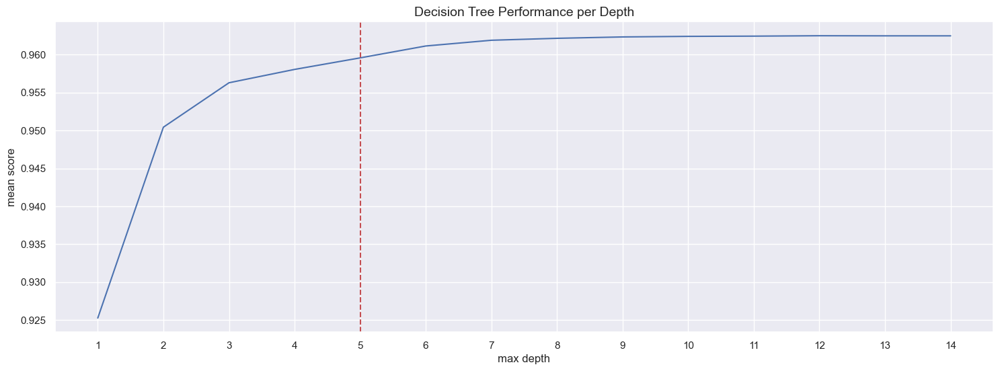

In [86]:
plt.figure(figsize=(18, 6))

plt.plot(tree_results['param_max_depth'], tree_results['mean_test_score'], label='True y')
plt.axvline(x=5, color='r', linestyle='--', label='x = 5')

plt.xticks(tree_results['param_max_depth'].astype(int))
plt.xlabel('max depth')
plt.ylabel('mean score')
plt.title('Decision Tree Performance per Depth', fontsize=14)

plt.savefig('Graphs/decision_tree_performance.png')
plt.show()

In [87]:
tree_regr = DecisionTreeRegressor(max_depth=5, random_state=33)
tree_regr.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=5, random_state=33)

In [88]:
tree_regr.get_n_leaves()

32

In [89]:
resid_metrics(tree_regr, X_test, y_test)

MAE: 0.17
MSE: 0.05
RMSE: 0.22
R2: 0.9598


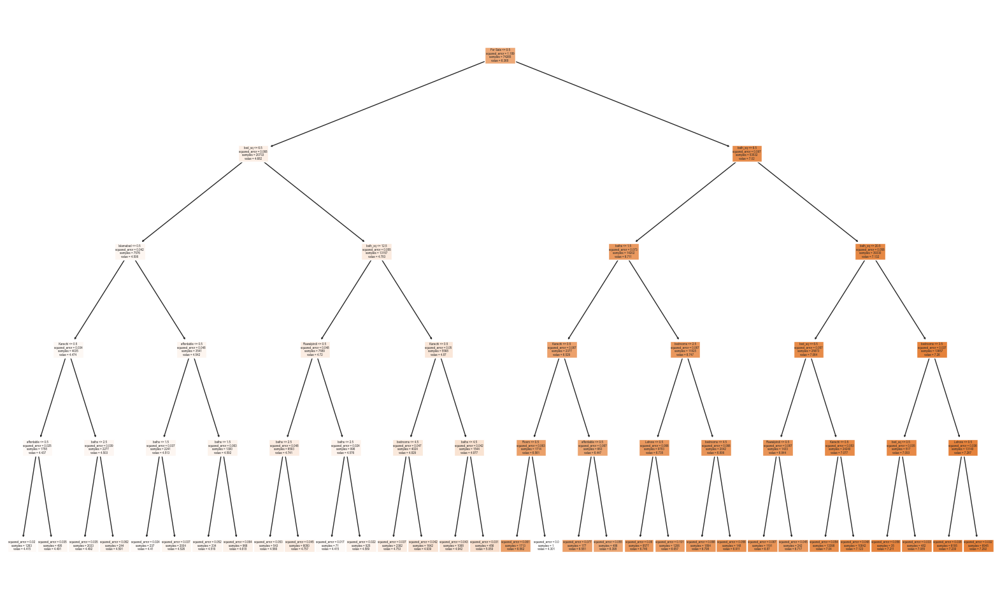

In [90]:
plt.figure(figsize=(20, 12))
plot_tree(tree_regr, filled=True, feature_names=X_train.columns)

plt.show()

> The feature variables percentage of importance

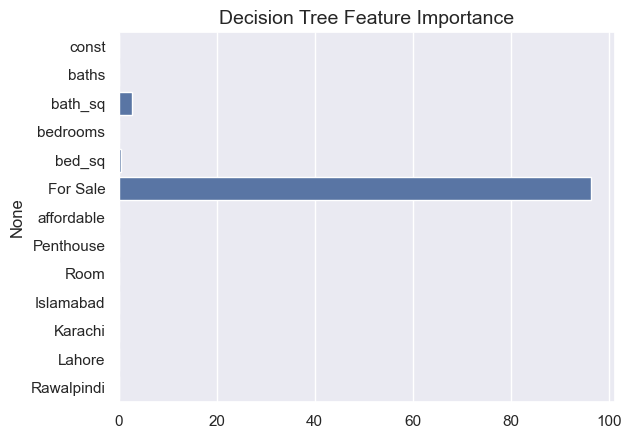

In [91]:
sns.barplot(y=X_train.columns, x=tree_regr.feature_importances_ * 100)
plt.title('Decision Tree Feature Importance', fontsize=14)
plt.savefig('Graphs/tree_feature_importance.png')

> With a cross validation the decision tree can almost have a bit better score than the linear regression model

In [92]:
cv = KFold(n_splits=5, shuffle=True, random_state=33)
scores = cross_val_score(DecisionTreeRegressor(max_depth=5), X, y, cv=cv)
print("Cross validation scores: ", scores)
print("Cross validation mean: ", round(scores.mean(), 5))

Cross validation scores:  [0.95981128 0.958482   0.96049637 0.95978781 0.9589443 ]
Cross validation mean:  0.9595


### Support Vector Regressor

> Lets see if the Support Vector Regressor can make more gain. <br>
> First we must scale the data in order the value's range to be the same.

In [93]:
scaler_x = StandardScaler()
X_train_scaled = scaler_x.fit_transform(X_train)
X_test_scaled = scaler_x.transform(X_test)

scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train.values.reshape(-1, 1))
y_test_scaled = scaler_y.transform(y_test.values.reshape(-1, 1))

In [94]:
svr = SVR(kernel='linear', epsilon=.5, C=.1, tol=0.1, max_iter=2000)
svr.fit(X_train_scaled, y_train_scaled.ravel())

SVR(C=0.1, epsilon=0.5, kernel='linear', max_iter=2000, tol=0.1)

> This score actually seems a bit promising if we consider that no hyperparams has been given

In [95]:
resid_metrics(svr, X_test_scaled, y_test_scaled)

MAE: 0.19
MSE: 0.05
RMSE: 0.23
R2: 0.9464


### Support Vector Regressor with Grid Search

> Lets see the best hyperparams that the grid search can give us as best.

In [96]:
param_grid = {
    'kernel': ['linear', 'poly', 'rbf'],
    'C': [.1, .5, 1, 5, 10], 
    'epsilon': [0.5, 1, 5, 10],
    'tol':[.1, .5],
    'max_iter':[1000]
}

In [97]:
svr_grid_search = GridSearchCV(SVR(), param_grid, n_jobs=-1, cv=4)

svr_pipeline = make_pipeline(StandardScaler(), svr_grid_search)
svr_pipeline.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gridsearchcv',
                 GridSearchCV(cv=4, estimator=SVR(), n_jobs=-1,
                              param_grid={'C': [0.1, 0.5, 1, 5, 10],
                                          'epsilon': [0.5, 1, 5, 10],
                                          'kernel': ['linear', 'poly', 'rbf'],
                                          'max_iter': [1000],
                                          'tol': [0.1, 0.5]}))])

In [98]:
svr_grid_search.best_params_

{'C': 0.5, 'epsilon': 0.5, 'kernel': 'rbf', 'max_iter': 1000, 'tol': 0.1}

In [99]:
resid_metrics(svr_pipeline, X_test, y_test)

MAE: 0.2
MSE: 0.06
RMSE: 0.25
R2: 0.948


### Support Vector Regressor with Optuna

> Here we will use optuna, a powerfull library that its purpose is to find the best parameter and optimize the performance of a model with magnificent results.

> First we will need to initialize a method that optuna will use to suggest parameters and try to find the optimals.

In [100]:
def objective_svr(trial):

    scaler_name = trial.suggest_categorical("scaler", 
                                            ["minmax", "standard"])

    if scaler_name == "minmax":
        scaler = MinMaxScaler()
    elif scaler_name == "standard":
        scaler = StandardScaler()

    C = trial.suggest_float('C', 0.01, 1)
    epsilon = trial.suggest_float('epsilon', 0.01, 1)
    kernel = trial.suggest_categorical('kernel', ['linear', 'poly', 'rbf'])
    
    svr = SVR(C=C, epsilon=epsilon, kernel=kernel, max_iter=1000)

    pipeline = make_pipeline(scaler, svr)

    score = cross_val_score(pipeline, X_train, y_train, scoring='r2', n_jobs=-1)
    return score.mean()

> Then we let optuna run and we will display the performance and the parameters it found as best.

In [101]:
study_svr = optuna.create_study(direction="maximize")
study_svr.optimize(objective_svr, n_trials=100, n_jobs=-1)

[I 2024-01-29 21:29:53,398] A new study created in memory with name: no-name-0c8fa3b0-aa49-461c-a4f7-4a18f54fef32
[I 2024-01-29 21:29:58,934] Trial 1 finished with value: -1.093206302659255 and parameters: {'scaler': 'minmax', 'C': 0.22654042436872246, 'epsilon': 0.156355335162359, 'kernel': 'poly'}. Best is trial 1 with value: -1.093206302659255.
[I 2024-01-29 21:30:00,367] Trial 4 finished with value: 0.891626036956483 and parameters: {'scaler': 'minmax', 'C': 0.27277995937494376, 'epsilon': 0.7418934103831137, 'kernel': 'rbf'}. Best is trial 4 with value: 0.891626036956483.
[I 2024-01-29 21:30:02,272] Trial 0 finished with value: 0.9313401767606436 and parameters: {'scaler': 'minmax', 'C': 0.23810835912703038, 'epsilon': 0.6081397697807718, 'kernel': 'rbf'}. Best is trial 0 with value: 0.9313401767606436.
[I 2024-01-29 21:30:04,950] Trial 8 finished with value: 0.812863060399468 and parameters: {'scaler': 'standard', 'C': 0.5651478104456116, 'epsilon': 0.8877056687440634, 'kernel': 

In [102]:
print('Number of finished trials: ', len(study_svr.trials))
print('Best trial:')
trial = study_svr.best_trial

print('Value: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'    {key}: {value}')

Number of finished trials:  100
Best trial:
Value:  0.9508263086572393
Params: 
    scaler: minmax
    C: 0.8820046835134544
    epsilon: 0.45768926729025206
    kernel: rbf


In [103]:
trials_df = study_svr.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head(7)

,number,value,datetime_start,datetime_complete,duration,params_C,params_epsilon,params_kernel,params_scaler,state
50,50,0.950826,2024-01-29 21:30:40.521242,2024-01-29 21:31:08.310402,0 days 00:00:27.789160,0.882005,0.457689,rbf,minmax,COMPLETE
92,92,0.949974,2024-01-29 21:31:43.962511,2024-01-29 21:32:08.609520,0 days 00:00:24.647009,0.956209,0.473180,rbf,minmax,COMPLETE
44,44,0.949886,2024-01-29 21:30:30.731899,2024-01-29 21:30:56.815808,0 days 00:00:26.083909,0.868535,0.454157,rbf,minmax,COMPLETE
30,30,0.949684,2024-01-29 21:30:09.344431,2024-01-29 21:30:34.463844,0 days 00:00:25.119413,0.883024,0.469815,rbf,minmax,COMPLETE
42,42,0.949673,2024-01-29 21:30:27.846483,2024-01-29 21:30:54.660960,0 days 00:00:26.814477,0.829812,0.461315,rbf,minmax,COMPLETE
86,86,0.949527,2024-01-29 21:31:34.478737,2024-01-29 21:31:57.324942,0 days 00:00:22.846205,0.950361,0.467857,rbf,standard,COMPLETE
32,32,0.949373,2024-01-29 21:30:11.208773,2024-01-29 21:30:39.051305,0 days 00:00:27.842532,0.808797,0.468518,rbf,minmax,COMPLETE


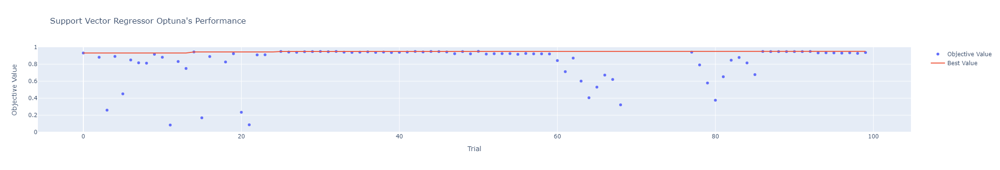

In [104]:
fig = plot_optimization_history(study_svr)
fig.update_layout(yaxis_range=[0, 1], title="Support Vector Regressor Optuna's Performance")

fig.write_html('Graphs/svr_optuna_performance1.html')
fig.show()

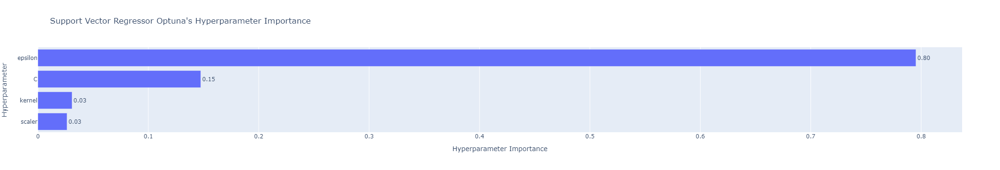

In [105]:
fig = plot_param_importances(study_svr)

fig.update_layout(title="Support Vector Regressor Optuna's Hyperparameter Importance")

fig.write_html('Graphs/svr_optuna_performance2.html')
fig.show()

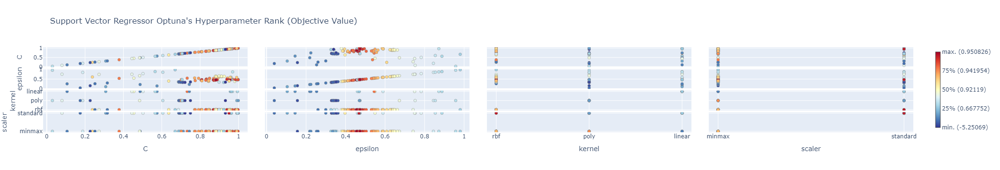

In [106]:
fig = plot_rank(study_svr)

fig.update_layout(title="Support Vector Regressor Optuna's Hyperparameter Rank (Objective Value)")
fig.write_html('Graphs/svr_optuna_performance3.html')
fig.show()

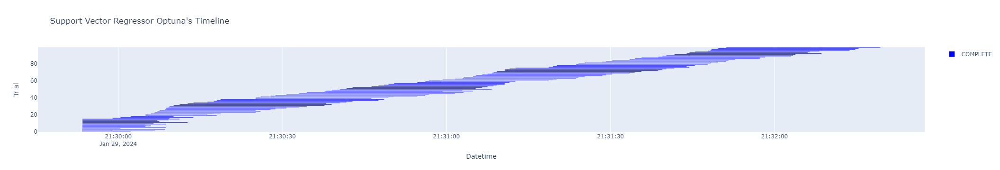

In [107]:
fig = plot_timeline(study_svr)

fig.update_layout(title="Support Vector Regressor Optuna's Timeline")
fig.write_html('Graphs/svr_optuna_timeline.html')
fig.show()

### Stochastic Gradient Descent Regressor

> Lets also check if the Stochastic Gradient Descent can perform better. <br>
> As we see without any hyperparams it have the score as the Linear Regression. Very promising

In [108]:
sgd = SGDRegressor(random_state=33)
sgd.fit(X_train_scaled, y_train_scaled.ravel())

SGDRegressor(random_state=33)

In [109]:
sgd.score(X_test_scaled, y_test_scaled)

0.9582780461273952

In [110]:
resid_metrics(sgd, X_test_scaled, y_test_scaled)

MAE: 0.16
MSE: 0.04
RMSE: 0.2
R2: 0.9583


In [111]:
print('*** Stochastic Gradient Descent Regressor Coefficients***')
list(zip(X_train.columns, sgd.coef_))

*** Stochastic Gradient Descent Regressor Coefficients***


[('const', 0.0),
 ('baths', 0.30467154285260767),
 ('bath_sq', -0.17438368046349342),
 ('bedrooms', 0.1270163533390411),
 ('bed_sq', -0.0806396580659928),
 ('For Sale', 0.9349810974123337),
 ('affordable', 0.003824218347542755),
 ('Penthouse', -0.0013367265345031105),
 ('Room', 0.007992142190934345),
 ('Islamabad', 0.0599288844157469),
 ('Karachi', 0.08022021396902353),
 ('Lahore', 0.0521647274243663),
 ('Rawalpindi', 0.01692782321394196)]

### Stochastic Gradient Descent Regressor with Grid Search

> Lets first try the grid search us a hyperparam optimization and cross validation. <br>
> As we see this didn't go us promised.

In [112]:
hyper_params = {
    'alpha': [.1, .3, .5, .75, 1, 2, 5, 10],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'l1_ratio': np.linspace(.0001,0.99, 10),
    'epsilon': np.linspace(0, 10, 20),
    'tol': [.01],
    'max_iter': [1000],
    'warm_start': [True, False]
}

In [113]:
sgd_grid_search = GridSearchCV(SGDRegressor(random_state=33), hyper_params, cv=5, n_jobs=-1)
sgd_pipeline = make_pipeline(StandardScaler(), sgd_grid_search)

sgd_pipeline.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gridsearchcv',
                 GridSearchCV(cv=5, estimator=SGDRegressor(random_state=33),
                              n_jobs=-1,
                              param_grid={'alpha': [0.1, 0.3, 0.5, 0.75, 1, 2,
                                                    5, 10],
                                          'epsilon': array([ 0.        ,  0.52631579,  1.05263158,  1.57894737,  2.10526316,
        2.63157895,  3.15789474,  3.68421053,  4.21052632,  4.73684211,
        5.26315789,  5.78947368,  6.31578947,  6.84210526,  7.36842105,
        7.89473684,  8.42105263,  8.94736842,  9.47368421, 10.        ]),
                                          'l1_ratio': array([1.00000000e-04, 1.10088889e-01, 2.20077778e-01, 3.30066667e-01,
       4.40055556e-01, 5.50044444e-01, 6.60033333e-01, 7.70022222e-01,
       8.80011111e-01, 9.90000000e-01]),
                                          'max_iter': [1000],
                                          'penalty': ['l1', 'l2', 'elasticnet'],
                                          'tol': [0.01],
                                          'warm_start': [True, False]}))])

In [114]:
sgd_grid_search.best_params_

{'alpha': 0.1,
 'epsilon': 0.0,
 'l1_ratio': 0.11008888888888889,
 'max_iter': 1000,
 'penalty': 'elasticnet',
 'tol': 0.01,
 'warm_start': True}

In [115]:
resid_metrics(sgd_pipeline, X_test, y_test)

MAE: 0.2
MSE: 0.06
RMSE: 0.25
R2: 0.9472


In [116]:
sgd_grid_search.best_score_

0.9470069328828222

### Stochastic Gradient Descent Regressor with Optuna

> Lets use the optuna in SGDR too in order to see what the best hyperparams might be.

In [117]:
def objective_sgdr(trial):

    scaler_name = trial.suggest_categorical("scaler", 
                                            ["minmax", "standard"])

    if scaler_name == "minmax":
        scaler = MinMaxScaler()
    elif scaler_name == "standard":
        scaler = StandardScaler()

    alpha = trial.suggest_float('alpha', 0.01, 1)
    epsilon = trial.suggest_float('epsilon', 0.01, 1)
    l1_ratio = trial.suggest_float('l1_ratio', 0.01, 1)
    penalty = trial.suggest_categorical('penalty', [None, 'elasticnet', 'l1', 'l2'])
    warm_start = trial.suggest_categorical('warm_start', [True, False])
    
    sgdr = SGDRegressor(alpha=alpha,
                        epsilon=epsilon,
                        l1_ratio=l1_ratio,
                        penalty=penalty,
                        warm_start=warm_start,
                        max_iter=1000,
                        random_state=33
                       )

    pipeline = make_pipeline(scaler, sgdr)

    score = cross_val_score(pipeline, X_train, y_train, scoring='r2', n_jobs=-1)
    return score.mean()

In [118]:
study_sgdr = optuna.create_study(direction="maximize")
study_sgdr.optimize(objective_sgdr, n_trials=100, n_jobs=-1)

[I 2024-01-29 21:36:44,550] A new study created in memory with name: no-name-980851d8-8ba3-4580-902d-2abb4b1e2f0f
[I 2024-01-29 21:36:44,931] Trial 0 finished with value: 0.9551939258084572 and parameters: {'scaler': 'minmax', 'alpha': 0.037833621369260294, 'epsilon': 0.8311564390977942, 'l1_ratio': 0.9747917315344704, 'penalty': None, 'warm_start': False}. Best is trial 0 with value: 0.9551939258084572.
[I 2024-01-29 21:36:45,122] Trial 1 finished with value: 0.9429765812120199 and parameters: {'scaler': 'standard', 'alpha': 0.11714277838032704, 'epsilon': 0.03027123371162245, 'l1_ratio': 0.20306790893099516, 'penalty': 'l2', 'warm_start': False}. Best is trial 0 with value: 0.9551939258084572.
[I 2024-01-29 21:36:45,278] Trial 4 finished with value: 0.8738800247099986 and parameters: {'scaler': 'standard', 'alpha': 0.4232418886481797, 'epsilon': 0.34771466354043423, 'l1_ratio': 0.11174556129327565, 'penalty': 'l2', 'warm_start': False}. Best is trial 0 with value: 0.9551939258084572.

In [119]:
print('Number of finished trials: ', len(study_sgdr.trials))
print('Best trial:')
trial = study_sgdr.best_trial

print('Value: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'    {key}: {value}')

Number of finished trials:  100
Best trial:
Value:  0.957198891060651
Params: 
    scaler: standard
    alpha: 0.07987110203021937
    epsilon: 0.6635448951551465
    l1_ratio: 0.7127792886993852
    penalty: None
    warm_start: True


In [120]:
trials_df = study_sgdr.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head(7)

,number,value,datetime_start,datetime_complete,duration,params_alpha,params_epsilon,params_l1_ratio,params_penalty,params_scaler,params_warm_start,state
50,50,0.957199,2024-01-29 21:36:46.561270,2024-01-29 21:36:47.316600,0 days 00:00:00.755330,0.117050,0.794697,0.647912,None,standard,True,COMPLETE
32,32,0.957199,2024-01-29 21:36:45.656441,2024-01-29 21:36:46.462097,0 days 00:00:00.805656,0.257529,0.981820,0.506855,None,standard,True,COMPLETE
34,34,0.957199,2024-01-29 21:36:45.735318,2024-01-29 21:36:46.551215,0 days 00:00:00.815897,0.225132,0.974783,0.339544,None,standard,True,COMPLETE
35,35,0.957199,2024-01-29 21:36:45.763937,2024-01-29 21:36:46.581006,0 days 00:00:00.817069,0.196753,0.596041,0.366595,None,standard,True,COMPLETE
36,36,0.957199,2024-01-29 21:36:45.855902,2024-01-29 21:36:46.605976,0 days 00:00:00.750074,0.219169,0.604752,0.314002,None,standard,True,COMPLETE
37,37,0.957199,2024-01-29 21:36:45.912979,2024-01-29 21:36:46.662051,0 days 00:00:00.749072,0.210658,0.636535,0.277166,None,standard,True,COMPLETE
38,38,0.957199,2024-01-29 21:36:46.002126,2024-01-29 21:36:46.671058,0 days 00:00:00.668932,0.188445,0.595509,0.263565,None,standard,True,COMPLETE


In [121]:
fig = plot_optimization_history(study_sgdr)

fig.update_layout(yaxis_range=[0, 1], title="Stochastic Gradient Descent Regressor Optuna's Performance")
fig.write_html('Graphs/sgdr_optuna_performance1.html')
fig.show()

In [122]:
fig = plot_param_importances(study_sgdr)

fig.update_layout(title="Stochastic Gradient Descent Regressor Optuna's Hyperparameter Importance")

fig.write_html('Graphs/sgdr_optuna_performance2.html')
fig.show()

In [123]:
fig = plot_rank(study_sgdr)

fig.update_layout(title="Stochastic Gradient Descent Regressor Optuna's Hyperparams Rank (Objective Value)",
                  width=1200,
                  height=900
                 )
fig.write_html('Graphs/sgdr_optuna_performance3.html')
fig.show()

In [124]:
fig = plot_timeline(study_sgdr)

fig.update_layout(title="Stochastic Gradient Descent Regressor Optuna's Timeline")
fig.write_html('Graphs/sgdr_optuna_timeline.html')
fig.show()

## 5. Results
---

> In this section, we present a comprehensive summary of the performance metrics for various machine learning models applied to predict house prices in marla. The performance metrics include accuracy scores, cross-validation results, and optimization outcomes through grid search and Optuna.

|                           | **Performance** | **Cross Validation** | **Grid Search** | **Optuna** | 
|---------------------------|-----------------|----------------------|-----------------|------------|
| **Decision Tree**         |   **95.98%**    |      **95.95%**      |   **95.96%**    |    **-**   |
| **SVR**                   |   **94.64%**    |        **-**         |   **94.80%**    | **95.08%** |
| **SGDR**                  |   **95.83%**    |        **-**         |   **94.72%**    | **95.72%** |
| **Linear Regression**     |   **95.83%**    |      **95.83%**      |      **-**      |    **-**   |
| **Ridge Regression**      |   **95.83%**    |      **95.83%**      |      **-**      |    **-**   |
| **Lasso Regression**      |   **8.56%**     |      **95.83%**      |      **-**      |    **-**   |


## 6. Model Exportation
---

>In this section, we delve into the exportation process of the Decision Tree Regressor, which emerged as the best-performing model in predicting house prices in marla. The Decision Tree Regressor, with its high accuracy and interpretability, stands ready for deployment, offering valuable insights into house price predictions in the context of marla units.

**Decision Tree Regressor Export**

 The model achieved an impressive performance score of **95.95%**. Let's outline the steps taken for its export:

1. **Training and Optimization:** The Decision Tree Regressor underwent extensive training and optimization. Cross-validation and grid search were employed to ensure the model's robustness. Hyperparameter tuning through grid search and Optuna resulted in a finely tuned model with a performance boost to **95.96%**.

2. **Serialization:** The Decision Tree model is serialized into a format suitable for deployment. Common serialization formats such as Pickle, ensuring seamless integration into various deployment environments.



In [125]:
with open('Models/Decision Tree.pkl', 'wb') as file:
    pickle.dump(tree_regr, file)